### Installs Required First Time: 

In [ ]:
# # First time need to download following libs: 
# !conda install -c conda-forge cvxpy
# !pip install riskfolio-lib
# !pip install quantstats
# !pip install yfinance
# !pip install dataframe-image

# # only if using extra libs & PyPortfolioOpt
# !pip install PyPortfolioOpt
# !pip install cvxportfolio
# !pip install ta
# !pip install pyfolio
# !pip install pyomo

## IMPORTS

In [145]:
# basic Python libs 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import scipy
from scipy.stats import zscore
from collections import defaultdict
from IPython.display import display
import pickle
import dataframe_image as dfi
import warnings
warnings.filterwarnings("ignore")

# market data & optimizers 
import yfinance as yf
import cvxpy as cp
import riskfolio as rp
import quantstats as qs
from quantstats import stats as qss
from quantstats import reports, plots

# probably not needed since eventually did most on Riskfolio-Lib
# from pypfopt import EfficientFrontier, risk_models, expected_returns, plotting
# from pypfopt.discrete_allocation import DiscreteAllocation, get_latest_prices
# from pypfopt.efficient_frontier import EfficientFrontier 
# import pypfopt.objective_functions as ppo 

# # extra optimizer & financial libs 
# import cvxportfolio as cvx
# import ta
# import pyfolio as pf
# import pyomo 
# from pyomo.opt import SolverFactory
# from pyomo.environ import *


## DEFINING SECURITIES

### Exchange-traded funds (ETFs): 
1. GSG - iShares Commodities ETF
2. EEM - iShares Emerging Markets ETF
3. QQQ - Tech (Nasdaq 100) ETF
4. SPY - S&P 500 ETF
5. VNQ - Vanguard Real Estate ETF
6. BND - Vanguard Bond ETF $92B AUM
7. IGOV - iShares Int'l Govt Bonds ETF
8. GLD - SPDR Gold Trust ETF
9. XLF - SPDR Financials ETF
10. XLV - SPDR Healthcare ETF
11. XRT - SPDR S&P Retail ETF
12. FXI - iShares China ETF
13. BTC-USD - Bitcoin

### Individual Securities / Tickers (largest market cap companies):
1. AAPL - Apple 
2. TSLA - Tesla 
3. MSFT - Microsoft
4. GOOG - Alphabet fka Google 
5. AMZN - Amazon
6. META - Meta Platforms fka Facebook
7. V - Visa 
8. JPM - JP Morgan 
9. XOM - Exxon-Mobil 
10. WMT - Walmart
11. JNJ - Johnson & Johnson 
12. UNH - United Health
13. BRK-B - Berkshire Hathaway 
14. BABA - Alibaba 
15. 0700.HK - Tencent Holdings
16. MC.PA - LVMH (Louis Vuitton Moet Hennessy)
17. 2222.SR - Saudi Aramco - Dropped 

## yfinance stock price download:

In [146]:

tickers_sectors = ['GSG', 'EEM', 'QQQ', 'SPY', 'VNQ', 'BND', 'IGOV', 'GLD', 'XLV', 'XLF', 'XRT', 'FXI', 'BTC-USD']
tickers_companies = ['AAPL', 'TSLA', 'MSFT', 'GOOG', 'AMZN', 'META', 'V', 'JPM', 'XOM', 'WMT', 'JNJ', 'UNH', 'BRK-B', 'BABA', '0700.HK', 'MC.PA'] #'2222.SR']
tickers = ['GSG', 'EEM', 'QQQ', 'SPY', 'VNQ', 'BND', 'IGOV', 'GLD', 'XLV', 'XLF', 'XRT', 'FXI', 'BTC-USD', 'AAPL', 
           'TSLA', 'MSFT', 'GOOG', 'AMZN', 'META', 'V', 'JPM', 'XOM', 'WMT', 'JNJ', 'UNH', 'BRK-B', 'BABA', '0700.HK', 'MC.PA'] #'2222.SR'] 


# Function to get stock data
def get_stock_data(symbol):
    data = yf.download(symbol, start="2010-01-01", end="2015-01-01")
    return data['Adj Close']

def get_stock_data_year(symbol, start_date, end_date):
    data = yf.download(symbol, start=start_date, end=end_date, progress=False)
    return data['Adj Close']

def prices_to_df(tickers, start_date="2010-01-01", end_date="2015-01-01"):
    stock_data = pd.DataFrame()
    for symbol in tickers:
        stock_data[symbol] = get_stock_data_year(symbol, start_date, end_date)
    return stock_data

# Calculate log returns
def calc_indiv_returns(prices_df):
    returns = np.log(prices_df / prices_df.shift(1))
    returns.fillna(value=0, inplace=True)
    return returns

def calc_indiv_period_returns(price_return_dictionary, start_year='2010', end_year='2011'):
    
    prices_0 = price_return_dictionary[start_year]['prices'].iloc[0]
    prices_1 = price_return_dictionary[end_year]['prices'].iloc[0]
    indiv_period_returns = np.log(prices_1 / prices_0)
    indiv_period_returns.fillna(value=0, inplace=True)
    return indiv_period_returns

def calc_pf_returns(weights, returns):
    return weights @ returns 

In [147]:
## Generate price & returns data, historical 2010-2015 and forward by year 2015-2022
hist_prices = prices_to_df(tickers)
hist_returns = calc_indiv_returns(hist_prices)

# create daily price & returns data for 2015-2022 for each year, and then in trailing 5-year chunks

price_returns_dict = defaultdict(lambda: defaultdict(int)) 
price_returns_dict_companies = defaultdict(lambda: defaultdict(int)) 

# annual prices & returns 
for year in range(2015, 2023):
    price_data = prices_to_df(tickers, f"{year}-01-01", f"{year+1}-01-01")
    returns_data = calc_indiv_returns(price_data)
    price_returns_dict[f'{year}']['prices'] = price_data
    price_returns_dict[f'{year}']['returns'] = returns_data

# trailing 5yr prices & returns     
for year in range(2016, 2024):
    trailing_5y_period = f"{year-5} ⟺ {year}"
    price_data_5y = prices_to_df(tickers, f"{year-5}-01-01", f"{year}-01-01")
    returns_data_5y = calc_indiv_returns(price_data_5y)
    price_returns_dict[trailing_5y_period]['prices'] = price_data_5y
    price_returns_dict[trailing_5y_period]['returns'] = returns_data_5y

# 2018-on multiyr prices & returns 
for year in range(2018, 2023):
    period = f"{year} ⟺ 2023"
    price_data_period = prices_to_df(tickers, f"{year}-01-01", '2023-01-01')
    returns_data_period = calc_indiv_returns(price_data_period)
    price_returns_dict[period]['prices'] = price_data_period
    price_returns_dict[period]['returns'] = returns_data_period
    
# just for 1/1/2015 ⟺ 1/1/2023 prices & returns 
price_data_full_period = prices_to_df(tickers, "2015-01-01", '2023-01-01')
returns_data_full_period = calc_indiv_returns(price_data_full_period)
price_returns_dict["2015 ⟺ 2023"]['prices'] = price_data_full_period
price_returns_dict["2015 ⟺ 2023"]['returns'] = returns_data_full_period

print(f'Daily Price & Returns DataFrames Available by in Dictionary by Year: \n{list(price_returns_dict.keys())[:8]}\n\n and by 5-year chunks: \n {list(price_returns_dict.keys())[8:16]} \n\n and by multi-year chunks: \n {list(price_returns_dict.keys())[16:]} ') 
multiyr_periods_list = list(price_returns_dict.keys())[8:]
print(f'multiyr periods list: {multiyr_periods_list}')


Daily Price & Returns DataFrames Available by in Dictionary by Year: 
['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

 and by 5-year chunks: 
 ['2011 ⟺ 2016', '2012 ⟺ 2017', '2013 ⟺ 2018', '2014 ⟺ 2019', '2015 ⟺ 2020', '2016 ⟺ 2021', '2017 ⟺ 2022', '2018 ⟺ 2023'] 

 and by multi-year chunks: 
 ['2019 ⟺ 2023', '2020 ⟺ 2023', '2021 ⟺ 2023', '2022 ⟺ 2023', '2015 ⟺ 2023'] 
multiyr periods list: ['2011 ⟺ 2016', '2012 ⟺ 2017', '2013 ⟺ 2018', '2014 ⟺ 2019', '2015 ⟺ 2020', '2016 ⟺ 2021', '2017 ⟺ 2022', '2018 ⟺ 2023', '2019 ⟺ 2023', '2020 ⟺ 2023', '2021 ⟺ 2023', '2022 ⟺ 2023', '2015 ⟺ 2023']


In [148]:
## Generate price & returns data, historical 2010-2015 and forward by year 2015-2022
hist_prices_companies = prices_to_df(tickers_companies)
hist_returns_companies = calc_indiv_returns(hist_prices_companies)

# create daily price & returns data for 2015-2022 for each year, and then in trailing 5-year chunks

price_returns_dict_companies = defaultdict(lambda: defaultdict(int)) 

# annual prices & returns 
for year in range(2015, 2023):
    price_data_companies = prices_to_df(tickers_companies, f"{year}-01-01", f"{year+1}-01-01")
    returns_data_companies = calc_indiv_returns(price_data_companies)
    price_returns_dict_companies[f'{year}']['prices'] = price_data_companies
    price_returns_dict_companies[f'{year}']['returns'] = returns_data_companies

# trailing 5yr prices & returns     
for year in range(2016, 2024):
    trailing_5y_period = f"{year-5} ⟺ {year}"
    price_data_5y_companies = prices_to_df(tickers_companies, f"{year-5}-01-01", f"{year}-01-01")
    returns_data_5y_companies = calc_indiv_returns(price_data_5y_companies)
    price_returns_dict_companies[trailing_5y_period]['prices'] = price_data_5y_companies
    price_returns_dict_companies[trailing_5y_period]['returns'] = returns_data_5y_companies

# 2018-on multiyr prices & returns 
for year in range(2018, 2023):
    period = f"{year} ⟺ 2023"
    price_data_period_companies = prices_to_df(tickers_companies, f"{year}-01-01", '2023-01-01')
    returns_data_period_companies = calc_indiv_returns(price_data_period_companies)
    price_returns_dict_companies[period]['prices'] = price_data_period_companies
    price_returns_dict_companies[period]['returns'] = returns_data_period_companies
    
# just for 1/1/2015 ⟺ 1/1/2023 prices & returns 
price_data_full_period_companies = prices_to_df(tickers_companies, "2015-01-01", '2023-01-01')
returns_data_full_period_companies = calc_indiv_returns(price_data_full_period_companies)
price_returns_dict_companies["2015 ⟺ 2023"]['prices'] = price_data_full_period_companies
price_returns_dict_companies["2015 ⟺ 2023"]['returns'] = returns_data_full_period_companies

print(f'Daily Price & Returns DataFrames Available by in Dictionary by Year: \n{list(price_returns_dict_companies.keys())[:8]}\n\n and by 5-year chunks: \n {list(price_returns_dict_companies.keys())[8:16]} \n\n and by multi-year chunks: \n {list(price_returns_dict_companies.keys())[16:]} ') 
multiyr_periods_list_companies = list(price_returns_dict_companies.keys())[8:]
print(f'multiyr periods list: {multiyr_periods_list_companies}')


Daily Price & Returns DataFrames Available by in Dictionary by Year: 
['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

 and by 5-year chunks: 
 ['2011 ⟺ 2016', '2012 ⟺ 2017', '2013 ⟺ 2018', '2014 ⟺ 2019', '2015 ⟺ 2020', '2016 ⟺ 2021', '2017 ⟺ 2022', '2018 ⟺ 2023'] 

 and by multi-year chunks: 
 ['2019 ⟺ 2023', '2020 ⟺ 2023', '2021 ⟺ 2023', '2022 ⟺ 2023', '2015 ⟺ 2023'] 
multiyr periods list: ['2011 ⟺ 2016', '2012 ⟺ 2017', '2013 ⟺ 2018', '2014 ⟺ 2019', '2015 ⟺ 2020', '2016 ⟺ 2021', '2017 ⟺ 2022', '2018 ⟺ 2023', '2019 ⟺ 2023', '2020 ⟺ 2023', '2021 ⟺ 2023', '2022 ⟺ 2023', '2015 ⟺ 2023']


## Pickle Prices & Returns Backup: 

#### Run this if need to restart so don't need to re-download all prices & returns data

In [5]:
price_returns_dict = defaultdict(lambda: defaultdict(int)) 
saved_price_returns_keys = ['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2011 ⟺ 2016', '2012 ⟺ 2017', '2013 ⟺ 2018', '2014 ⟺ 2019', '2015 ⟺ 2020', '2016 ⟺ 2021', '2017 ⟺ 2022', '2018 ⟺ 2023', '2019 ⟺ 2023', '2020 ⟺ 2023', '2021 ⟺ 2023', '2022 ⟺ 2023', '2015 ⟺ 2023']

def pickle_backup():
    """
    Before restarting kernel, run this to download backup 
    """
     
    for key in price_returns_dict.keys():
        with open(f'price_return_dict{key}.pickle', 'wb') as f:
            pickle.dump(price_returns_dict[key], f)

def pickle_load():
    """
    Run this to retrieve from backup (using the saved dict keys)
    """
    
    for key in saved_price_returns_keys:
        file = open(f'price_return_dict{key}.pickle', 'rb')
        # dump information to that file
        price_returns_dict[key] = pickle.load(file)


# pickle_backup()
# pickle_load()

hist_prices = prices_to_df(tickers)
hist_returns = calc_indiv_returns(hist_prices)
price_data_full_period = prices_to_df(tickers, "2015-01-01", '2023-01-01')
returns_data_full_period = calc_indiv_returns(price_data_full_period)
multiyr_periods_list = list(price_returns_dict.keys())[8:]

In [189]:
def returns_fwd(returns_next=price_returns_dict['2015 ⟺ 2020']['returns'], optimal_weights=None, companies=False):
    optimal_returns_fwd = returns_next @ optimal_weights
    optimal_returns_fwd = optimal_returns_fwd[1:]
    # optimal_returns_fwd.rename(columns={"weights": "PF_Return"}, inplace=True)
    
    if companies:
        uniform_weights = np.full(len(tickers_companies), 1/len(tickers_companies))
        uniform_returns_fwd = returns_next @ uniform_weights
        uniform_returns_fwd = uniform_returns_fwd[1:]
    else:    
        uniform_weights = np.full(len(tickers), 1/len(tickers))
        uniform_returns_fwd = returns_next @ uniform_weights
        uniform_returns_fwd = uniform_returns_fwd[1:]
        
    return optimal_returns_fwd, uniform_returns_fwd

## Price Correlation Heatmap Between All 26 Securities:

In [150]:
corr_df = hist_prices.corr().round(2) # round to 2 decimal places
fig_corr = px.imshow(corr_df, text_auto=True, title = 'Correlation between Individual Securities', width=1000, height=1100)
fig_corr.write_image("Correlation Heatmap - All 29 Securities.png")

fig_corr.show()

corr_df_companies = hist_prices_companies.corr().round(2) # round to 2 decimal places
fig_corr_companies = px.imshow(corr_df_companies, text_auto=True, title = 'Correlation between Individual Securities', width=1000, height=1100)
fig_corr_companies.write_image("Correlation Heatmap - Companies Only.png")

fig_corr_companies.show()

In [151]:
# other helper functions 

def prices_for_allocations(optimization_year='2015'):
    prices_year = price_returns_dict[optimization_year]['prices']
    prices_row_vector = prices_year.iloc[0]
    return prices_row_vector

def qs_perf(returns=None):
    pf_perf = {}
    pf_perf['returns'] = qss.comp(returns)
    metrics = ['volatility', 'sharpe', 'sortino', 'max_drawdown', 'var', 'cvar']
        
    pf_perf['volatility'] = qss.volatility(returns)
    pf_perf['sharpe'] = qss.sharpe(returns)
    pf_perf['sortino'] = qss.sortino(returns)
    pf_perf['max_drawdown'] = qss.max_drawdown(returns)
    pf_perf['VaR'] = qss.var(returns)
    pf_perf['CVaR'] = qss.cvar(returns)
    return pf_perf

# def calc_risk (pf_returns):
#     # VaR[t] = np.percentile(portfolio_returns_t[:, -1], 100 * alpha)
#     # CVaR[t] = (1 / (1 - alpha)) * cp.sum(cp.maximum(portfolio_returns_t[:, -1], VaR[t])) / (t+1)
#     # drawdown[:, t] = cp.maximum.accumulate(cp.cumsum(portfolio_returns_t, axis=0)) - cp.cumsum(portfolio_returns_t, axis=0)

# Riskfolio-Lib Optimizations:

In [154]:
rm_list = ['CVaR', 'MV', 'MDD', 'MAD', 'FLPM', 'UCI', 'CDaR']#, 'EVaR', 'RG', 'WR', 'MSV', 'SLPM', 'GMD', 'TG', 'EDaR', 'RLVaR']


In [186]:
def calculate_w(returns=hist_returns, opt_year='2015', rm='CVaR', companies=False): 
    """
    Available Options for Risk Measures: 
    'MV': Standard Deviation.
    'KT': Square Root of Kurtosis.
    'MAD': Mean Absolute Deviation.
    'GMD': Gini Mean Difference.
    'MSV': Semi Standard Deviation.
    'SKT': Square Root of Semi Kurtosis.
    'FLPM': First Lower Partial Moment (Omega Ratio).
    'SLPM': Second Lower Partial Moment (Sortino Ratio).
    'CVaR': Conditional Value at Risk.
    'TG': Tail Gini.
    'EVaR': Entropic Value at Risk.
    'RLVaR': Relativistic Value at Risk.
    'WR': Worst Realization (Minimax).
    'RG': Range of returns.
    'CVRG': CVaR range of returns.
    'TGRG': Tail Gini range of returns.
    'MDD': Maximum Drawdown of uncompounded cumulative returns (Calmar Ratio).
    'ADD': Average Drawdown of uncompounded cumulative returns.
    'CDaR': Conditional Drawdown at Risk of uncompounded cumulative returns.
    'EDaR': Entropic Drawdown at Risk of uncompounded cumulative returns.
    'RLDaR': Relativistic Drawdown at Risk of uncompounded cumulative returns.
    'UCI': Ulcer Index of uncompounded cumulative returns.
    """
    # from https://riskfolio-lib.readthedocs.io/en/latest/reports.html 
    #  NOTHING CALCULATES FORWARD RETURNS! 
    
    # Building the portfolio object
    # https://riskfolio-lib.readthedocs.io/en/latest/portfolio.html 
    port = rp.Portfolio(returns=returns)

    # Select method and estimate input parameters:
    method_mu='hist' # Method to estimate expected returns based on historical data. 
    method_cov='hist' # Method to estimate covariance matrix based on historical data.
    port.assets_stats (method_mu=method_mu, method_cov=method_cov, d=0.94)
    
    # Constraints configuration:
    # other constraint options include min return, max risk, turnover limits
    # pretty weak that can't add individual weight constraints or net exposure ranges 
    
    port.sht = True     # bool for allowing short positions (negative weights)
    port.uppersht = 1   # max sum of short weights 
    port.upperlng = 2 # max sum of long weights
    port.budget = 1   # port.upperlng - port.uppersht 

    # Estimate optimal portfolio:
    model='Classic' # Could be Classic (historical), BL (Black Litterman) or FM (Factor Model)
    rm = rm 
    obj = 'Sharpe' # Objective function, could be MinRisk, MaxRet, Utility or Sharpe
    hist = True # Use historical scenarios for risk measures that depend on scenarios
    rf = 0 # Risk free rate
    l = 0 # Risk aversion factor, only useful when obj is 'Utility'

    w = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
    # display(w)
    
    mu = port.mu
    cov = port.cov
    # port_returns = port.returns
    if companies:
        port_returns = price_returns_dict_companies[f'{opt_year}']['returns']
    else: 
        port_returns = price_returns_dict[f'{opt_year}']['returns']
    print(port_returns.shape, w.shape)
    
    # _risk = rpr.Sharpe_Risk(w=w, cov=cov, returns=port_returns, rm=rm) * (252 ** 0.5)
    # _sharpe = rpr.Sharpe(w=w, mu=mu, cov=cov, returns=port_returns, rm=rm)

    _return = port_returns @ w
    _return = (_return + 1).cumprod() - 1
    _vol = _return.std() * (252 ** 0.5)
    print(f'Portfolio Stats for {opt_year}:\n Portfolio Annual Return: {_return.iloc[-1].get(0):.2%}\n PF Annualized Vol: {_vol.get(0):.2%}')
    _sharpe = (_return.iloc[-1].get(0) - 0.02) / _vol.get(0)
    print(f'Portfolio Calculated Sharpe Ratio: {_sharpe:.3f}\n\n')
    
    # frontier = port.efficient_frontier(model=model, rm=rm, points=50, rf=rf, hist=hist)
    # optimization_dict = {"frontier": frontier, "mu": mu, "cov": cov, "returns": port_returns, "rm": rm, "rf": rf}
    # ax = rp.plot_frontier(w_frontier=frontier, mu=mu, cov=cov, returns=port_returns, rm=rm, rf=rf, alpha=0.05, w=w)
    # ax1 = rp.plot_range(returns=port_returns, w=w, alpha=0.05)

    return w

## Riskfolio CVaR Optimization Runs, 2015-2022:

In [156]:
rm = 'CVaR'
full_holding_period = list(price_returns_dict.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
cvar_mpo_weights_df = calculate_w(hist_returns, rm=rm)
cvar_mpo_returns, _ = returns_fwd(price_returns_dict['2015']['returns'], cvar_mpo_weights_df)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']    
    cvar_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm=rm)
    cvar_mpo_weights_df = pd.concat([cvar_mpo_weights_df, cvar_mpo_weights_new], axis=1)
    cvar_pf_returns, _ = returns_fwd(price_returns_dict[f'{year}']['returns'], cvar_mpo_weights_new)
    cvar_mpo_returns = pd.concat([cvar_mpo_returns, cvar_pf_returns])

cols = list(price_returns_dict.keys())[:8]
cvar_mpo_weights_df.columns = cols
cvar_mpo_returns.columns = ['Daily PF Returns']
with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(cvar_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(cvar_mpo_returns)

daily_cumul_returns_fwd = (1 + cvar_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_cvar_mpo_cum = px.line(daily_cumul_returns_fwd, title="Cumulative Returns of MPO Optimized Portfolio Indexed to 100")
fig_cvar_mpo_cum.update_layout(showlegend=False)
fig_cvar_mpo_cum.show()
fig_cvar_mpo_cum.write_image("CVaR_MPO_cumulative_returns.png")



Portfolio Stats for 2015:
 Portfolio Annual Return: 1.62%
 PF Annualized Vol: 20.79%
Portfolio Calculated Sharpe Ratio: -0.018


Portfolio Stats for 2016:
 Portfolio Annual Return: -0.02%
 PF Annualized Vol: 25.72%
Portfolio Calculated Sharpe Ratio: -0.078


Portfolio Stats for 2017:
 Portfolio Annual Return: 14.50%
 PF Annualized Vol: 71.70%
Portfolio Calculated Sharpe Ratio: 0.174


Portfolio Stats for 2018:
 Portfolio Annual Return: 0.17%
 PF Annualized Vol: 20.23%
Portfolio Calculated Sharpe Ratio: -0.091


Portfolio Stats for 2019:
 Portfolio Annual Return: 17.27%
 PF Annualized Vol: 96.70%
Portfolio Calculated Sharpe Ratio: 0.158


Portfolio Stats for 2020:
 Portfolio Annual Return: 12.92%
 PF Annualized Vol: 59.51%
Portfolio Calculated Sharpe Ratio: 0.184


Portfolio Stats for 2021:
 Portfolio Annual Return: -4.12%
 PF Annualized Vol: 25.53%
Portfolio Calculated Sharpe Ratio: -0.240


Portfolio Stats for 2022:
 Portfolio Annual Return: -19.01%
 PF Annualized Vol: 78.89%
Portfoli

,2015,2016,2017,2018,2019,2020,2021,2022
GSG,-7.7577%,-9.4311%,-9.0738%,-5.9827%,-7.0801%,-4.5726%,-2.6254%,0.1175%
EEM,-27.4816%,-34.3103%,-16.0040%,-8.4337%,-11.4877%,-6.0904%,-8.3572%,-24.2704%
QQQ,-2.4569%,-17.6312%,-34.1487%,-43.8953%,-21.4313%,-53.0888%,-1.2621%,-18.3629%
SPY,22.7593%,16.0059%,37.8372%,53.0594%,19.6818%,23.8552%,0.5990%,-22.7257%
VNQ,1.9574%,-1.2357%,-3.4926%,-8.3275%,-5.2245%,-3.9414%,-5.5685%,-2.4353%
BND,79.6645%,79.7959%,73.6672%,71.8049%,85.4324%,87.8192%,66.1721%,60.4400%
IGOV,-2.9549%,12.3733%,10.1849%,5.8046%,5.5727%,-5.7081%,19.3768%,6.8666%
GLD,1.2273%,-3.4131%,-4.6253%,-2.5933%,1.7432%,8.2130%,2.0187%,12.8326%
XLV,7.9493%,23.4118%,-1.7486%,-3.2768%,0.0000%,-1.6189%,-17.9597%,8.8727%
XLF,-15.4918%,-17.1200%,0.7621%,-7.8195%,-32.0813%,-15.3206%,-23.1842%,-15.9564%


Portfolio Daily Returns Using CVaR as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,0.9847%
2015-01-06,0.3164%
2015-01-07,0.5736%
2015-01-08,0.9749%
2015-01-09,-0.3323%
...,...
2022-12-23,-0.4852%
2022-12-27,-1.4761%
2022-12-28,0.2323%


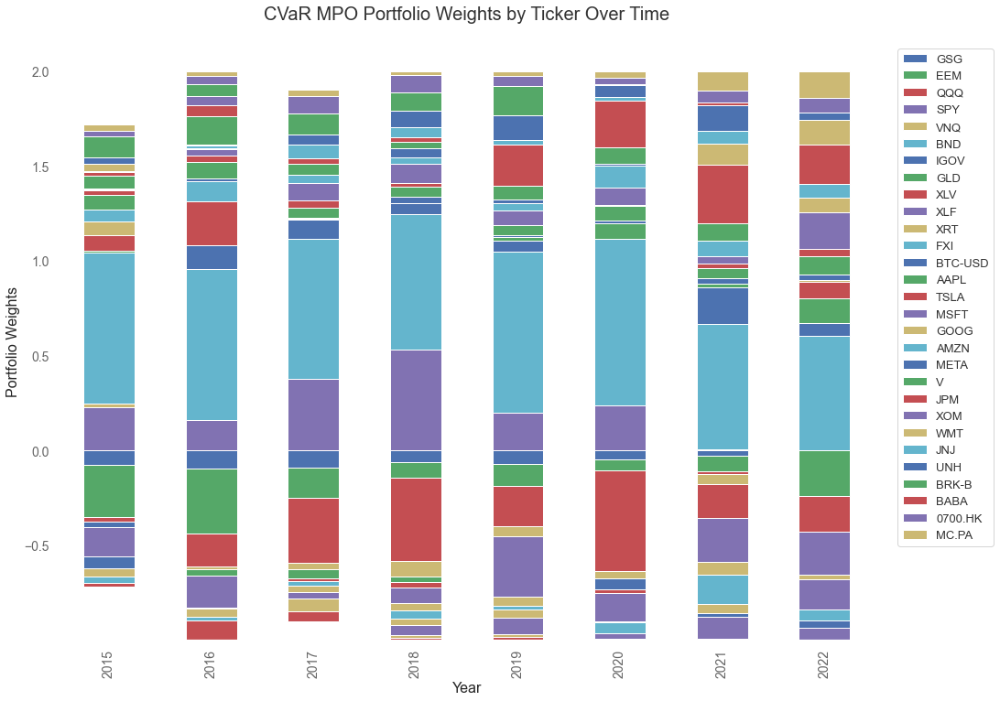

In [157]:
# Plot weights across time: 

# with pandas / plt 
cvar_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('CVaR MPO Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_cvar_mpo_weights = px.bar(cvar_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_cvar_mpo_weights.update_layout(
    title = 'Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_cvar_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_cvar_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_cvar_mpo_weights.show()

fig_cvar_mpo_weights.write_image("CVaR_MPO_Weights.png")

### Riskfolio CVaR Optimizations - Performance Analysis:

In [158]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
cvar_spo_weights = calculate_w(hist_returns, rm=rm)
cvar_spo_returns, uniform_returns = returns_fwd(returns_data_full_period, cvar_spo_weights)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo = qs.reports.metrics(cvar_mpo_returns, benchmark = cvar_spo_returns)
report_mpo_uniform = qs.reports.metrics(cvar_mpo_returns, benchmark = uniform_returns)
report_spo_uniform = qs.reports.metrics(cvar_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo, report_mpo_uniform, report_spo_uniform)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_cvar_mpo_daily = px.line(cvar_mpo_returns, title='Daily CVaR MPO Portfolio Returns - 2015-2022')
fig_cvar_mpo_daily.update_layout(showlegend=False)
fig_cvar_mpo_daily.show()

fig_cvar_spo_daily = px.line(cvar_spo_returns, title='Daily CVaR SPO Portfolio Returns - 2015-2022')
fig_cvar_spo_daily.update_layout(showlegend=False)
fig_cvar_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily CVaR Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_cvar_cumul_returns_mpo = (1 + cvar_mpo_returns).cumprod() * 100
fig2 = px.line(daily_cvar_cumul_returns_mpo, title="Cumulative Returns of CVaR MPO Portfolio Indexed to 100: 2015-2022")
fig2.update_layout(showlegend=False)
fig2.show()
# fig2.write_image("CVaR_MPO_cumulative_returns.png")

daily_cvar_cumul_returns_spo = (1 + cvar_spo_returns).cumprod() * 100
fig3 = px.line(daily_cvar_cumul_returns_spo, title="Cumulative Returns of CVaR SPO Portfolio Indexed to 100: 2015-2022")
fig3.update_layout(showlegend=False)
fig3.show()
fig3.write_image("CVaR_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
fig3 = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
fig3.update_layout(showlegend=False)
fig3.show()

Portfolio Stats for 2015:
 Portfolio Annual Return: 1.62%
 PF Annualized Vol: 20.79%
Portfolio Calculated Sharpe Ratio: -0.018


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   19.84%      35.31%
CAGR﹪              2.29%       3.86%

Sharpe              0.3         0.47
Prob. Sharpe Ratio  80.44%      90.95%
Sortino             0.43        0.68
Sortino/√2          0.3         0.48
Omega               1.06        1.06

Max Drawdown        -24.25%     -14.18%
Longest DD Days     780         962

Gain/Pain Ratio     0.06        0.08
Gain/Pain (1M)      0.29        0.46

Payoff Ratio        0.95        1.02
Profit Factor       1.06        1.08
Common Sense Ratio  1.0         1.05
CPC Index           0.53        0.57
Tail Ratio          0.95        0.96
Outlier Win Ratio   

None

None

None

## Riskfolio MV Optimization Runs, 2015-2022:

In [159]:
rm = 'MV'
full_holding_period = list(price_returns_dict.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
mv_mpo_weights_df = calculate_w(hist_returns, rm='MV')
mv_mpo_returns, _ = returns_fwd(price_returns_dict['2015']['returns'], mv_mpo_weights_df)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']    
    mv_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='MV')
    mv_mpo_weights_df = pd.concat([mv_mpo_weights_df, mv_mpo_weights_new], axis=1)
    mv_pf_returns, _ = returns_fwd(price_returns_dict[f'{year}']['returns'], mv_mpo_weights_new)
    mv_mpo_returns = pd.concat([mv_mpo_returns, mv_pf_returns])

cols = list(price_returns_dict.keys())[:8]
mv_mpo_weights_df.columns = cols
mv_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(mv_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(mv_mpo_returns)

mv_daily_cumul_returns_fwd = (1 + mv_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_mv_mpo_cum = px.line(mv_daily_cumul_returns_fwd, title="Cumulative Returns of Mean-Variance MPO Optimized Portfolio Indexed to 100")
fig_mv_mpo_cum.update_layout(showlegend=False)
fig_mv_mpo_cum.show()
fig_mv_mpo_cum.write_image("Mean-Variance_MPO_cumulative_returns.png")



Portfolio Stats for 2015:
 Portfolio Annual Return: 4.04%
 PF Annualized Vol: 14.23%
Portfolio Calculated Sharpe Ratio: 0.144


Portfolio Stats for 2016:
 Portfolio Annual Return: 2.82%
 PF Annualized Vol: 27.16%
Portfolio Calculated Sharpe Ratio: 0.030


Portfolio Stats for 2017:
 Portfolio Annual Return: 18.04%
 PF Annualized Vol: 88.54%
Portfolio Calculated Sharpe Ratio: 0.181


Portfolio Stats for 2018:
 Portfolio Annual Return: -1.93%
 PF Annualized Vol: 22.48%
Portfolio Calculated Sharpe Ratio: -0.175


Portfolio Stats for 2019:
 Portfolio Annual Return: 20.26%
 PF Annualized Vol: 107.54%
Portfolio Calculated Sharpe Ratio: 0.170


Portfolio Stats for 2020:
 Portfolio Annual Return: 18.62%
 PF Annualized Vol: 88.17%
Portfolio Calculated Sharpe Ratio: 0.188


Portfolio Stats for 2021:
 Portfolio Annual Return: -6.43%
 PF Annualized Vol: 30.64%
Portfolio Calculated Sharpe Ratio: -0.275


Portfolio Stats for 2022:
 Portfolio Annual Return: -22.20%
 PF Annualized Vol: 91.38%
Portfolio

,2015,2016,2017,2018,2019,2020,2021,2022
GSG,-5.8801%,-10.3961%,-9.9468%,-7.5266%,-8.7168%,-1.3897%,-2.0779%,0.0000%
EEM,-19.8718%,-24.7702%,-16.9589%,-13.5032%,-10.5005%,-8.9715%,-14.3989%,-25.1322%
QQQ,-11.3670%,-33.7124%,-21.6751%,-33.5450%,-24.9303%,-33.5488%,-4.7958%,-11.5136%
SPY,28.5918%,46.0129%,46.0722%,66.6688%,21.0001%,41.1993%,0.0000%,-26.1663%
VNQ,0.0269%,-2.7811%,-5.6750%,-9.8943%,-2.2389%,-4.6742%,-11.0256%,-6.4082%
BND,80.5530%,83.1683%,80.7079%,72.1380%,86.5271%,80.6858%,42.7315%,41.5046%
IGOV,-2.8870%,1.7101%,1.1722%,4.4930%,-4.0700%,-3.0614%,26.8938%,23.4162%
GLD,1.0542%,-0.5709%,-2.5920%,-1.9358%,4.9389%,5.8196%,10.8409%,13.2408%
XLV,6.2664%,14.5066%,-8.4976%,-12.7769%,-4.9254%,-8.4079%,-12.6967%,10.6183%
XLF,-11.2575%,-15.4980%,6.3291%,-5.2380%,-25.5022%,-19.0793%,-26.4222%,-10.4052%


Portfolio Daily Returns Using MV as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,0.5216%
2015-01-06,0.3122%
2015-01-07,0.4705%
2015-01-08,0.7149%
2015-01-09,-0.2677%
...,...
2022-12-23,-0.5336%
2022-12-27,-1.7601%
2022-12-28,0.3566%


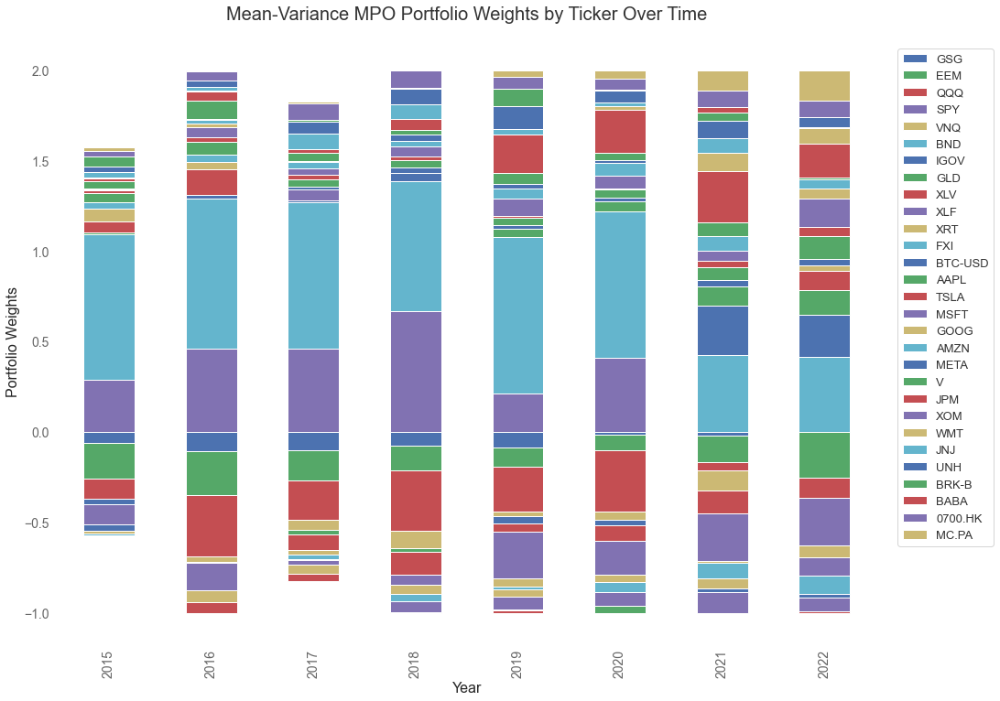

In [160]:
# Plot weights across time: 

# with pandas / plt 
mv_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('Mean-Variance MPO Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_mv_mpo_weights = px.bar(mv_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_mv_mpo_weights.update_layout(
    title = 'MV MPO Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_mv_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_mv_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_mv_mpo_weights.show()

fig_mv_mpo_weights.write_image("MV_MPO_Weights.png")

### Riskfolio MV Optimizations - Performance Analysis:

In [161]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
mv_spo_weights = calculate_w(hist_returns, rm='MV')
mv_spo_returns, uniform_returns = returns_fwd(returns_data_full_period, mv_spo_weights)

# Generating Quantstats Portfolio Comparison Reports: 
mv_report_mpo_spo = qs.reports.metrics(mv_mpo_returns, benchmark = mv_spo_returns)
mv_report_mpo_uniform = qs.reports.metrics(mv_mpo_returns, benchmark = uniform_returns)
mv_report_spo_uniform = qs.reports.metrics(mv_spo_returns, benchmark = uniform_returns)
display(mv_report_mpo_spo, mv_report_mpo_uniform, mv_report_spo_uniform)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_mv_mpo_daily = px.line(mv_mpo_returns, title='Daily Mean-Variance MPO Portfolio Returns - 2015-2022')
fig_mv_mpo_daily.update_layout(showlegend=False)
fig_mv_mpo_daily.show()

fig_mv_spo_daily = px.line(mv_spo_returns, title='Daily Mean-Variance SPO Portfolio Returns - 2015-2022')
fig_mv_spo_daily.update_layout(showlegend=False)
fig_mv_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily Mean-Variance Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_mv_cumul_returns_mpo = (1 + mv_mpo_returns).cumprod() * 100
mv_cum_fig = px.line(daily_mv_cumul_returns_mpo, title="Cumulative Returns of Mean-Variance MPO Portfolio Indexed to 100: 2015-2022")
mv_cum_fig.update_layout(showlegend=False)
mv_cum_fig.show()
mv_cum_fig.write_image("MV_MPO_cumulative_returns.png")

daily_mv_cumul_returns_spo = (1 + mv_spo_returns).cumprod() * 100
mv_spo_cum_fig = px.line(daily_mv_cumul_returns_spo, title="Cumulative Returns of MV SPO Portfolio Indexed to 100: 2015-2022")
mv_spo_cum_fig.update_layout(showlegend=False)
mv_spo_cum_fig.show()
mv_spo_cum_fig.write_image("MV_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
mv_daily_uniform_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
mv_daily_uniform_cum.update_layout(showlegend=False)
mv_daily_uniform_cum.show()

Portfolio Stats for 2015:
 Portfolio Annual Return: 4.04%
 PF Annualized Vol: 14.23%
Portfolio Calculated Sharpe Ratio: 0.144


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   28.59%      36.68%
CAGR﹪              3.2%        3.99%

Sharpe              0.41        0.58
Prob. Sharpe Ratio  87.63%      94.85%
Sortino             0.58        0.83
Sortino/√2          0.41        0.59
Omega               1.08        1.08

Max Drawdown        -29.22%     -15.37%
Longest DD Days     780         685

Gain/Pain Ratio     0.08        0.11
Gain/Pain (1M)      0.38        0.61

Payoff Ratio        0.95        0.96
Profit Factor       1.08        1.11
Common Sense Ratio  1.01        1.1
CPC Index           0.54        0.57
Tail Ratio          0.94        0.99
Outlier Win Ratio   3.

None

None

None

## Riskfolio Max-Drawdown Optimization Runs, 2015-2022:

In [162]:
# rm_list = ['CVaR', 'MV', 'MAD', 'EVaR', 'MDD', 'RG', 'WR']
rm = 'MDD'
full_holding_period = list(price_returns_dict.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
mdd_mpo_weights_df = calculate_w(hist_returns, rm='MDD')
mdd_mpo_returns, _ = returns_fwd(price_returns_dict['2015']['returns'], mdd_mpo_weights_df)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']    
    mdd_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='MDD')
    mdd_mpo_weights_df = pd.concat([mdd_mpo_weights_df, mdd_mpo_weights_new], axis=1)
    mdd_pf_returns, _ = returns_fwd(price_returns_dict[f'{year}']['returns'], mdd_mpo_weights_new)
    mdd_mpo_returns = pd.concat([mdd_mpo_returns, mdd_pf_returns])

cols = list(price_returns_dict.keys())[:8]
mdd_mpo_weights_df.columns = cols
mdd_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(mdd_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(mdd_mpo_returns)

daily_cumul_returns_fwd_mdd = (1 + mdd_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_mdd_mpo_cum = px.line(daily_cumul_returns_fwd_mdd, title="Cumulative Returns of MDD MPO Optimized Portfolio Indexed to 100")
fig_mdd_mpo_cum.update_layout(showlegend=False)
fig_mdd_mpo_cum.show()
fig_mdd_mpo_cum.write_image("MDD_MPO_cumulative_returns.png")



Portfolio Stats for 2015:
 Portfolio Annual Return: 7.04%
 PF Annualized Vol: 37.12%
Portfolio Calculated Sharpe Ratio: 0.136


Portfolio Stats for 2016:
 Portfolio Annual Return: 3.96%
 PF Annualized Vol: 26.23%
Portfolio Calculated Sharpe Ratio: 0.075


Portfolio Stats for 2017:
 Portfolio Annual Return: 17.81%
 PF Annualized Vol: 88.58%
Portfolio Calculated Sharpe Ratio: 0.178


Portfolio Stats for 2018:
 Portfolio Annual Return: 1.04%
 PF Annualized Vol: 19.73%
Portfolio Calculated Sharpe Ratio: -0.049


Portfolio Stats for 2019:
 Portfolio Annual Return: 16.50%
 PF Annualized Vol: 91.78%
Portfolio Calculated Sharpe Ratio: 0.158


Portfolio Stats for 2020:
 Portfolio Annual Return: 14.09%
 PF Annualized Vol: 63.33%
Portfolio Calculated Sharpe Ratio: 0.191


Portfolio Stats for 2021:
 Portfolio Annual Return: -6.15%
 PF Annualized Vol: 34.38%
Portfolio Calculated Sharpe Ratio: -0.237


Portfolio Stats for 2022:
 Portfolio Annual Return: -18.32%
 PF Annualized Vol: 88.02%
Portfolio C

,2015,2016,2017,2018,2019,2020,2021,2022
GSG,-12.7263%,-9.3410%,-7.1173%,-11.1277%,-6.5632%,-1.2183%,-1.0433%,-1.5608%
EEM,-24.6139%,-21.8446%,-19.1585%,-2.9456%,-12.4792%,-9.2870%,-30.0099%,-42.7530%
QQQ,-38.9646%,-8.8872%,-24.0804%,-38.1864%,-25.6368%,-37.2912%,-0.0000%,-0.0000%
SPY,51.1105%,0.0000%,13.0782%,37.2820%,30.0966%,23.1429%,-0.0000%,-11.7979%
VNQ,-3.0645%,-8.2180%,-5.5324%,-21.9770%,-5.1882%,-7.3992%,-16.2219%,-13.3329%
BND,59.3833%,80.9502%,88.1270%,84.0458%,86.6868%,97.0381%,31.0986%,30.0339%
IGOV,4.4606%,9.9273%,3.8306%,9.9649%,2.5182%,-13.0934%,47.8585%,58.4953%
GLD,1.3027%,-6.0793%,-7.5791%,-3.6691%,3.6146%,10.5928%,14.8585%,0.0000%
XLV,13.9963%,5.2567%,-13.4243%,-7.3134%,-0.0000%,-8.4523%,-0.0000%,-0.0000%
XLF,-4.4091%,-27.2547%,-0.0000%,-0.0000%,-26.3914%,-18.5354%,-27.7972%,-6.8030%


Portfolio Daily Returns Using MDD as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,-0.2331%
2015-01-06,0.5866%
2015-01-07,0.0424%
2015-01-08,1.4403%
2015-01-09,-0.6703%
...,...
2022-12-23,-0.5372%
2022-12-27,-1.6782%
2022-12-28,0.7607%


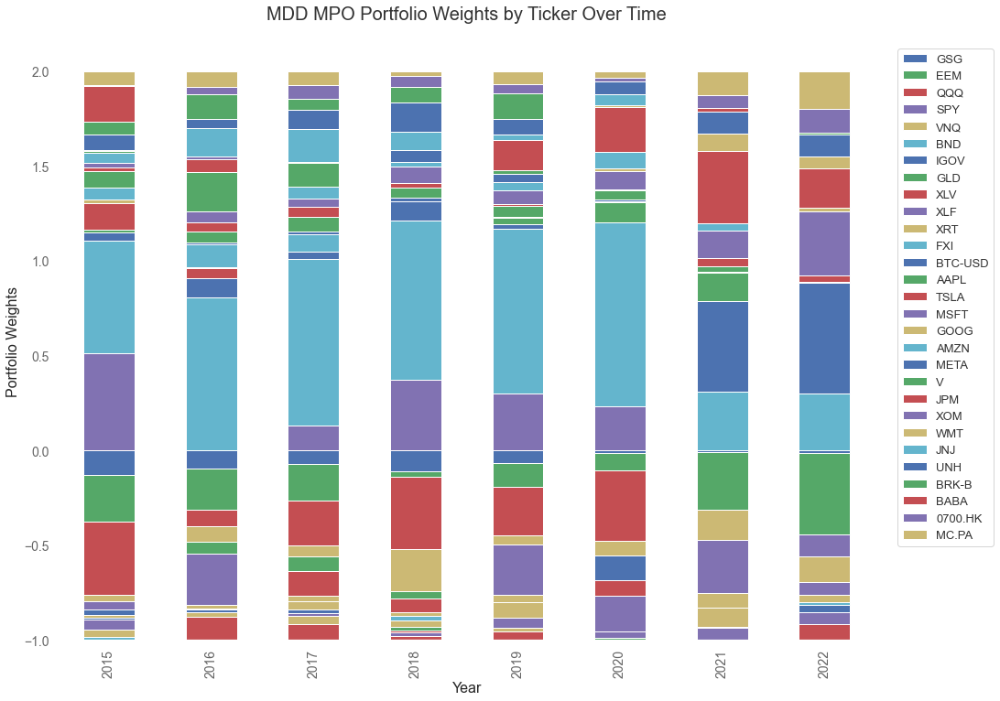

In [163]:
# Plot weights across time: 

# with pandas / plt 
mdd_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('MDD MPO Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_mdd_mpo_weights = px.bar(mdd_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_mdd_mpo_weights.update_layout(
    title = 'MDD MPO Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_mdd_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_mdd_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_mdd_mpo_weights.show()

fig_mdd_mpo_weights.write_image("MDD_MPO_Weights.png")

### Riskfolio Max Drawdown Optimizations - Performance Analysis:

In [164]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
mdd_spo_weights = calculate_w(hist_returns, rm='MDD')
mdd_spo_returns, uniform_returns = returns_fwd(returns_data_full_period, mdd_spo_weights)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo_mdd = qs.reports.metrics(mdd_mpo_returns, benchmark = mdd_spo_returns)
report_mpo_uniform_mdd = qs.reports.metrics(mdd_mpo_returns, benchmark = uniform_returns)
report_spo_uniform_mdd = qs.reports.metrics(mdd_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo_mdd, report_mpo_uniform_mdd, report_spo_uniform_mdd)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_mdd_mpo_daily = px.line(mdd_mpo_returns, title='Daily MDD MPO Portfolio Returns - 2015-2022')
fig_mdd_mpo_daily.update_layout(showlegend=False)
fig_mdd_mpo_daily.show()

fig_mdd_spo_daily = px.line(mdd_spo_returns, title='Daily MDD SPO Portfolio Returns - 2015-2022')
fig_mdd_spo_daily.update_layout(showlegend=False)
fig_mdd_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily MDD Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_mdd_cumul_returns_mpo = (1 + mdd_mpo_returns).cumprod() * 100
fig_cumul_mdd_mpo = px.line(daily_mdd_cumul_returns_mpo, title="Cumulative Returns of MDD MPO Portfolio Indexed to 100: 2015-2022")
fig_cumul_mdd_mpo.update_layout(showlegend=False)
fig_cumul_mdd_mpo.show()

daily_mdd_cumul_returns_spo = (1 + mdd_spo_returns).cumprod() * 100
fig_cum_mdd_spo = px.line(daily_mdd_cumul_returns_spo, title="Cumulative Returns of MDD SPO Portfolio Indexed to 100: 2015-2022")
fig_cum_mdd_spo.update_layout(showlegend=False)
fig_cum_mdd_spo.show()
fig_cum_mdd_spo.write_image("MDD_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
uniform_mdd_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
uniform_mdd_cum.update_layout(showlegend=False)
uniform_mdd_cum.show()

Portfolio Stats for 2015:
 Portfolio Annual Return: 7.04%
 PF Annualized Vol: 37.12%
Portfolio Calculated Sharpe Ratio: 0.136


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   34.96%      55.23%
CAGR﹪              3.82%       5.66%

Sharpe              0.44        0.53
Prob. Sharpe Ratio  89.49%      93.26%
Sortino             0.63        0.78
Sortino/√2          0.45        0.55
Omega               1.09        1.09

Max Drawdown        -30.22%     -34.55%
Longest DD Days     724         808

Gain/Pain Ratio     0.09        0.1
Gain/Pain (1M)      0.42        0.52

Payoff Ratio        0.95        1.02
Profit Factor       1.09        1.1
Common Sense Ratio  1.08        1.12
CPC Index           0.55        0.57
Tail Ratio          0.99        1.02
Outlier Win Ratio   4.5

None

None

None

## Riskfolio MAD Optimization Runs, 2015-2022:

In [194]:

rm = 'MAD'
full_holding_period = list(price_returns_dict.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
mad_mpo_weights_df = calculate_w(hist_returns, rm='MAD')
mad_mpo_returns, _ = returns_fwd(price_returns_dict['2015']['returns'], mad_mpo_weights_df)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']    
    mad_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='MAD')
    mad_mpo_weights_df = pd.concat([mad_mpo_weights_df, mad_mpo_weights_new], axis=1)
    mad_pf_returns, _ = returns_fwd(price_returns_dict[f'{year}']['returns'], mad_mpo_weights_new)
    mad_mpo_returns = pd.concat([mad_mpo_returns, mad_pf_returns])

cols = list(price_returns_dict.keys())[:8]
mad_mpo_weights_df.columns = cols
mad_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(mad_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(mad_mpo_returns)

daily_cumul_returns_fwd_mad = (1 + mad_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_mad_mpo_cum = px.line(daily_cumul_returns_fwd_mad, title="Cumulative Returns of MAD MPO Optimized Portfolio Indexed to 100")
fig_mad_mpo_cum.update_layout(showlegend=False)
fig_mad_mpo_cum.show()
fig_mad_mpo_cum.write_image("MAD_MPO_cumulative_returns.png")



(252, 29) (29, 1)
Portfolio Stats for 2015:
 Portfolio Annual Return: 3.80%
 PF Annualized Vol: 15.57%
Portfolio Calculated Sharpe Ratio: 0.115


(252, 29) (29, 1)
Portfolio Stats for 2016:
 Portfolio Annual Return: 3.38%
 PF Annualized Vol: 28.81%
Portfolio Calculated Sharpe Ratio: 0.048


(251, 29) (29, 1)
Portfolio Stats for 2017:
 Portfolio Annual Return: 19.17%
 PF Annualized Vol: 95.17%
Portfolio Calculated Sharpe Ratio: 0.180


(251, 29) (29, 1)
Portfolio Stats for 2018:
 Portfolio Annual Return: -3.03%
 PF Annualized Vol: 24.61%
Portfolio Calculated Sharpe Ratio: -0.204


(252, 29) (29, 1)
Portfolio Stats for 2019:
 Portfolio Annual Return: 22.74%
 PF Annualized Vol: 117.46%
Portfolio Calculated Sharpe Ratio: 0.177


(253, 29) (29, 1)
Portfolio Stats for 2020:
 Portfolio Annual Return: 18.34%
 PF Annualized Vol: 87.93%
Portfolio Calculated Sharpe Ratio: 0.186


(252, 29) (29, 1)
Portfolio Stats for 2021:
 Portfolio Annual Return: -1.55%
 PF Annualized Vol: 19.21%
Portfolio Calc

,2015,2016,2017,2018,2019,2020,2021,2022
GSG,-6.0809%,-9.3651%,-8.7055%,-6.6601%,-8.5259%,-1.8153%,-2.6513%,-0.4088%
EEM,-22.5278%,-25.7184%,-16.9054%,-14.1450%,-12.4455%,-9.3183%,-7.0431%,-7.4317%
QQQ,-12.9934%,-35.2345%,-21.3748%,-35.4905%,-29.1637%,-39.4232%,-16.9117%,-12.9160%
SPY,36.4809%,45.8951%,42.2283%,63.8840%,20.3327%,34.2283%,26.2569%,-30.2108%
VNQ,0.8178%,-2.0350%,-6.1347%,-9.9799%,-1.1630%,-4.1539%,-10.7202%,-3.2621%
BND,79.3955%,81.1846%,80.2510%,71.8401%,84.2325%,82.9192%,73.2902%,67.9615%
IGOV,-0.8940%,-0.0510%,-0.4355%,2.7572%,-5.8833%,-3.5639%,2.0329%,-1.1593%
GLD,1.4514%,0.5814%,-2.5191%,-1.9370%,6.4330%,6.4830%,7.7594%,11.1611%
XLV,7.2804%,15.0633%,-8.9620%,-13.0763%,-7.3607%,-6.1097%,-14.0230%,11.6710%
XLF,-13.8440%,-15.4792%,9.2485%,-3.8955%,-18.5334%,-15.7928%,-22.4877%,-8.4995%


Portfolio Daily Returns Using MAD as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,0.8175%
2015-01-06,0.2014%
2015-01-07,0.3961%
2015-01-08,0.7778%
2015-01-09,-0.2971%
...,...
2022-12-23,-0.4260%
2022-12-27,-1.4915%
2022-12-28,0.3745%


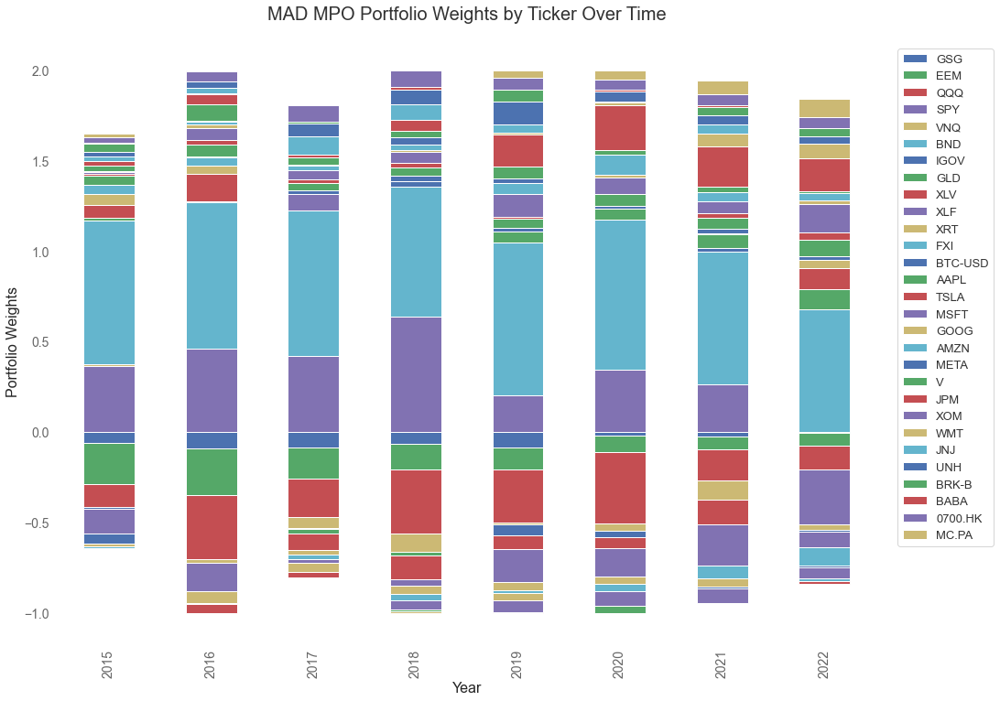

In [195]:
# Plot weights across time: 

# with pandas / plt 
mad_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('MAD MPO Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_mad_mpo_weights = px.bar(mad_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_mad_mpo_weights.update_layout(
    title = 'MAD MPO Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_mad_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_mad_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_mad_mpo_weights.show()

fig_mad_mpo_weights.write_image("MAD_MPO_Weights.png")

### Riskfolio MAD (Mean Absolute Deviation) Optimizations - Performance Analysis:

In [196]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
mad_spo_weights = calculate_w(hist_returns, rm='MAD')
mad_spo_returns, uniform_returns = returns_fwd(returns_data_full_period, mad_spo_weights)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo_mad = qs.reports.metrics(mad_mpo_returns, benchmark = mad_spo_returns)
report_mpo_uniform_mad = qs.reports.metrics(mad_mpo_returns, benchmark = uniform_returns)
report_spo_uniform_mad = qs.reports.metrics(mad_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo_mad, report_mpo_uniform_mad, report_spo_uniform_mad)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_mad_mpo_daily = px.line(mad_mpo_returns, title='Daily MAD MPO Portfolio Returns - 2015-2022')
fig_mad_mpo_daily.update_layout(showlegend=False)
fig_mad_mpo_daily.show()

fig_mad_spo_daily = px.line(mad_spo_returns, title='Daily MAD SPO Portfolio Returns - 2015-2022')
fig_mad_spo_daily.update_layout(showlegend=False)
fig_mad_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily MAD Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_mad_cumul_returns_mpo = (1 + mad_mpo_returns).cumprod() * 100
fig_cumul_mad_mpo = px.line(daily_mad_cumul_returns_mpo, title="Cumulative Returns of MAD MPO Portfolio Indexed to 100: 2015-2022")
fig_cumul_mad_mpo.update_layout(showlegend=False)
fig_cumul_mad_mpo.show()

daily_mad_cumul_returns_spo = (1 + mad_spo_returns).cumprod() * 100
fig_cum_mad_spo = px.line(daily_mad_cumul_returns_spo, title="Cumulative Returns of MAD SPO Portfolio Indexed to 100: 2015-2022")
fig_cum_mad_spo.update_layout(showlegend=False)
fig_cum_mad_spo.show()
fig_cum_mad_spo.write_image("MAD_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
uniform_mad_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
uniform_mad_cum.update_layout(showlegend=False)
uniform_mad_cum.show()

(252, 29) (29, 1)
Portfolio Stats for 2015:
 Portfolio Annual Return: 3.80%
 PF Annualized Vol: 15.57%
Portfolio Calculated Sharpe Ratio: 0.115


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   45.01%      25.24%
CAGR﹪              4.76%       2.86%

Sharpe              0.63        0.4
Prob. Sharpe Ratio  96.23%      87.2%
Sortino             0.91        0.57
Sortino/√2          0.64        0.41
Omega               1.12        1.12

Max Drawdown        -22.25%     -16.3%
Longest DD Days     780         849

Gain/Pain Ratio     0.12        0.07
Gain/Pain (1M)      0.65        0.38

Payoff Ratio        0.97        0.94
Profit Factor       1.12        1.07
Common Sense Ratio  1.08        1.02
CPC Index           0.58        0.53
Tail Ratio          0.96        0.95
Outlie

None

None

None

## Riskfolio FLPM (First Lower Partial Moment) Optimization Runs, 2015-2022:

In [168]:
rm = 'FLPM'
full_holding_period = list(price_returns_dict.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
flpm_mpo_weights_df = calculate_w(hist_returns, rm='FLPM')
flpm_mpo_returns, _ = returns_fwd(price_returns_dict['2015']['returns'], flpm_mpo_weights_df)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']    
    flpm_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='FLPM')
    flpm_mpo_weights_df = pd.concat([flpm_mpo_weights_df, flpm_mpo_weights_new], axis=1)
    flpm_pf_returns, _ = returns_fwd(price_returns_dict[f'{year}']['returns'], flpm_mpo_weights_new)
    flpm_mpo_returns = pd.concat([flpm_mpo_returns, flpm_pf_returns])

cols = list(price_returns_dict.keys())[:8]
flpm_mpo_weights_df.columns = cols
flpm_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(flpm_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(flpm_mpo_returns)

daily_cumul_returns_fwd_flpm = (1 + flpm_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_flpm_mpo_cum = px.line(daily_cumul_returns_fwd_flpm, title="Cumulative Returns of FLPM MPO Optimized Portfolio Indexed to 100")
fig_flpm_mpo_cum.update_layout(showlegend=False)
fig_flpm_mpo_cum.show()
fig_flpm_mpo_cum.write_image("FLPM_MPO_cumulative_returns.png")



Portfolio Stats for 2015:
 Portfolio Annual Return: 4.22%
 PF Annualized Vol: 15.82%
Portfolio Calculated Sharpe Ratio: 0.140


Portfolio Stats for 2016:
 Portfolio Annual Return: 3.13%
 PF Annualized Vol: 29.78%
Portfolio Calculated Sharpe Ratio: 0.038


Portfolio Stats for 2017:
 Portfolio Annual Return: 19.34%
 PF Annualized Vol: 95.90%
Portfolio Calculated Sharpe Ratio: 0.181


Portfolio Stats for 2018:
 Portfolio Annual Return: -3.12%
 PF Annualized Vol: 23.25%
Portfolio Calculated Sharpe Ratio: -0.220


Portfolio Stats for 2019:
 Portfolio Annual Return: 22.32%
 PF Annualized Vol: 117.41%
Portfolio Calculated Sharpe Ratio: 0.173


Portfolio Stats for 2020:
 Portfolio Annual Return: 17.95%
 PF Annualized Vol: 85.77%
Portfolio Calculated Sharpe Ratio: 0.186


Portfolio Stats for 2021:
 Portfolio Annual Return: -1.91%
 PF Annualized Vol: 19.37%
Portfolio Calculated Sharpe Ratio: -0.202


Portfolio Stats for 2022:
 Portfolio Annual Return: -18.32%
 PF Annualized Vol: 78.61%
Portfolio

,2015,2016,2017,2018,2019,2020,2021,2022
GSG,-6.0183%,-8.4496%,-8.3741%,-5.6014%,-8.6233%,-2.5184%,-2.7468%,-0.3614%
EEM,-21.5684%,-25.2591%,-18.9422%,-14.2542%,-10.1460%,-8.1963%,-2.8147%,-9.3591%
QQQ,-12.9618%,-35.6524%,-20.7164%,-32.6524%,-32.9562%,-39.5537%,-23.7441%,-4.8477%
SPY,30.7329%,45.4127%,45.8629%,56.3973%,20.3640%,31.3048%,26.4481%,-42.0449%
VNQ,0.0631%,-1.3615%,-4.8080%,-8.6515%,-1.8958%,-2.8474%,-11.2203%,-2.8136%
BND,78.7756%,78.9564%,78.6851%,75.0831%,86.0191%,81.2045%,77.8794%,69.4082%
IGOV,-0.4984%,4.2571%,-0.6857%,0.4395%,-6.2620%,-4.6980%,0.6648%,-0.1740%
GLD,1.1561%,-0.7898%,-1.8408%,-1.7316%,5.5150%,7.2951%,5.6032%,10.2227%
XLV,8.1815%,14.1584%,-9.6139%,-12.1823%,-5.4184%,-7.2516%,-10.9196%,9.6977%
XLF,-10.5251%,-16.5272%,5.9654%,-0.9071%,-17.8713%,-14.3438%,-24.2898%,-6.2332%


Portfolio Daily Returns Using FLPM as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,0.6357%
2015-01-06,0.2406%
2015-01-07,0.4467%
2015-01-08,0.7194%
2015-01-09,-0.2979%
...,...
2022-12-23,-0.4530%
2022-12-27,-1.6154%
2022-12-28,0.3737%


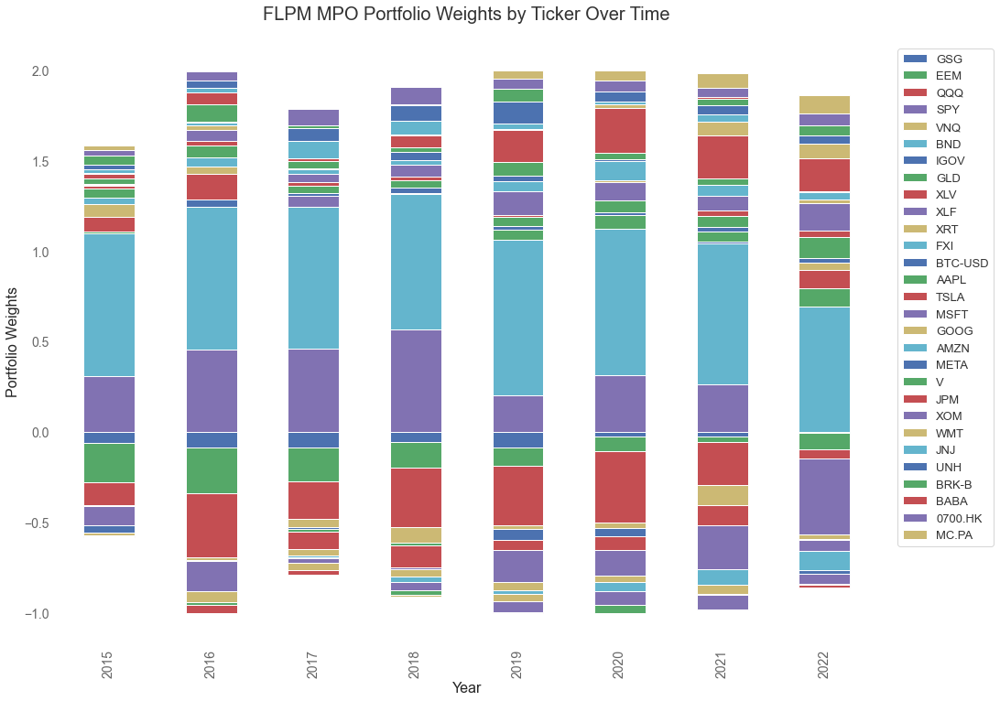

In [169]:
# Plot weights across time: 

# with pandas / plt 
flpm_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('FLPM MPO Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_flpm_mpo_weights = px.bar(flpm_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_flpm_mpo_weights.update_layout(
    title = 'FLPM MPO Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_flpm_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_flpm_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_flpm_mpo_weights.show()

fig_flpm_mpo_weights.write_image("FLPM_MPO_Weights.png")

### Riskfolio FLPM Optimizations - Performance Analysis:

In [170]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
flpm_spo_weights = calculate_w(hist_returns, rm='FLPM')
flpm_spo_returns, uniform_returns = returns_fwd(returns_data_full_period, flpm_spo_weights)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo_flpm = qs.reports.metrics(flpm_mpo_returns, benchmark = flpm_spo_returns)
report_mpo_uniform_flpm = qs.reports.metrics(flpm_mpo_returns, benchmark = uniform_returns)
report_spo_uniform_flpm = qs.reports.metrics(flpm_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo_flpm, report_mpo_uniform_flpm, report_spo_uniform_flpm)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_flpm_mpo_daily = px.line(flpm_mpo_returns, title='Daily FLPM MPO Portfolio Returns - 2015-2022')
fig_flpm_mpo_daily.update_layout(showlegend=False)
fig_flpm_mpo_daily.show()

fig_flpm_spo_daily = px.line(flpm_spo_returns, title='Daily FLPM SPO Portfolio Returns - 2015-2022')
fig_flpm_spo_daily.update_layout(showlegend=False)
fig_flpm_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily FLPM Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_flpm_cumul_returns_mpo = (1 + flpm_mpo_returns).cumprod() * 100
fig_cumul_flpm_mpo = px.line(daily_flpm_cumul_returns_mpo, title="Cumulative Returns of FLPM MPO Portfolio Indexed to 100: 2015-2022")
fig_cumul_flpm_mpo.update_layout(showlegend=False)
fig_cumul_flpm_mpo.show()

daily_flpm_cumul_returns_spo = (1 + flpm_spo_returns).cumprod() * 100
fig_cum_flpm_spo = px.line(daily_flpm_cumul_returns_spo, title="Cumulative Returns of FLPM SPO Portfolio Indexed to 100: 2015-2022")
fig_cum_flpm_spo.update_layout(showlegend=False)
fig_cum_flpm_spo.show()
fig_cum_flpm_spo.write_image("FLPM_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
uniform_flpm_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
uniform_flpm_cum.update_layout(showlegend=False)
uniform_flpm_cum.show()

Portfolio Stats for 2015:
 Portfolio Annual Return: 4.22%
 PF Annualized Vol: 15.82%
Portfolio Calculated Sharpe Ratio: 0.140


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   43.64%      32.5%
CAGR﹪              4.64%       3.59%

Sharpe              0.61        0.52
Prob. Sharpe Ratio  95.82%      92.7%
Sortino             0.88        0.74
Sortino/√2          0.63        0.52
Omega               1.12        1.12

Max Drawdown        -22.7%      -15.37%
Longest DD Days     780         716

Gain/Pain Ratio     0.12        0.1
Gain/Pain (1M)      0.63        0.53

Payoff Ratio        0.95        0.94
Profit Factor       1.12        1.1
Common Sense Ratio  1.06        1.09
CPC Index           0.57        0.55
Tail Ratio          0.94        1.0
Outlier Win Ratio   3.54  

None

None

None

## Riskfolio UCI (Ulcer Index) Optimization Runs, 2015-2022:


In [171]:

rm = 'UCI'
full_holding_period = list(price_returns_dict.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
uci_mpo_weights_df = calculate_w(hist_returns, rm='UCI')
uci_mpo_returns, _ = returns_fwd(price_returns_dict['2015']['returns'], uci_mpo_weights_df)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']    
    uci_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='UCI')
    uci_mpo_weights_df = pd.concat([uci_mpo_weights_df, uci_mpo_weights_new], axis=1)
    uci_pf_returns, _ = returns_fwd(price_returns_dict[f'{year}']['returns'], uci_mpo_weights_new)
    uci_mpo_returns = pd.concat([uci_mpo_returns, uci_pf_returns])

cols = list(price_returns_dict.keys())[:8]
uci_mpo_weights_df.columns = cols
uci_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(uci_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(uci_mpo_returns)

daily_cumul_returns_fwd_uci = (1 + uci_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_uci_mpo_cum = px.line(daily_cumul_returns_fwd_uci, title="Cumulative Returns of UCI MPO Optimized Portfolio Indexed to 100")
fig_uci_mpo_cum.update_layout(showlegend=False)
fig_uci_mpo_cum.show()
fig_uci_mpo_cum.write_image("UCI_MPO_cumulative_returns.png")



Portfolio Stats for 2015:
 Portfolio Annual Return: 4.34%
 PF Annualized Vol: 23.67%
Portfolio Calculated Sharpe Ratio: 0.099


Portfolio Stats for 2016:
 Portfolio Annual Return: 4.75%
 PF Annualized Vol: 24.97%
Portfolio Calculated Sharpe Ratio: 0.110


Portfolio Stats for 2017:
 Portfolio Annual Return: 18.84%
 PF Annualized Vol: 90.98%
Portfolio Calculated Sharpe Ratio: 0.185


Portfolio Stats for 2018:
 Portfolio Annual Return: 0.44%
 PF Annualized Vol: 17.09%
Portfolio Calculated Sharpe Ratio: -0.091


Portfolio Stats for 2019:
 Portfolio Annual Return: 17.67%
 PF Annualized Vol: 94.29%
Portfolio Calculated Sharpe Ratio: 0.166


Portfolio Stats for 2020:
 Portfolio Annual Return: 16.16%
 PF Annualized Vol: 72.44%
Portfolio Calculated Sharpe Ratio: 0.195


Portfolio Stats for 2021:
 Portfolio Annual Return: -4.39%
 PF Annualized Vol: 25.91%
Portfolio Calculated Sharpe Ratio: -0.246


Portfolio Stats for 2022:
 Portfolio Annual Return: -10.82%
 PF Annualized Vol: 56.49%
Portfolio C

,2015,2016,2017,2018,2019,2020,2021,2022
GSG,-5.9268%,-6.9724%,-5.7540%,-5.9380%,-7.1817%,-0.5380%,-5.0979%,0.4343%
EEM,-19.9594%,-18.2644%,-18.8231%,-8.3661%,-7.6028%,-9.8531%,-11.4100%,-13.0478%
QQQ,-27.0277%,-24.2352%,-24.9225%,-38.5349%,-36.6423%,-36.7688%,-0.0000%,0.0000%
SPY,70.9292%,42.3304%,44.6015%,54.5009%,15.1327%,14.8525%,-0.0000%,-43.3005%
VNQ,-6.5409%,-5.5839%,-6.9177%,-15.0359%,-6.1093%,-4.1713%,-10.6632%,-5.5381%
BND,84.0018%,87.6718%,82.8817%,83.1431%,89.9648%,86.9449%,79.6571%,76.5104%
IGOV,-3.2234%,2.2952%,5.4390%,2.6617%,-2.1170%,-8.3355%,0.0000%,1.5306%
GLD,-2.2082%,-4.4150%,-6.0227%,-3.4123%,1.0075%,10.3483%,11.3424%,9.1962%
XLV,5.4875%,4.9260%,-7.8386%,-8.9124%,-0.0000%,-7.3534%,-13.8517%,3.6401%
XLF,-11.6152%,-21.8995%,-1.5895%,-5.9249%,-17.6960%,-22.6447%,-31.8187%,-19.3260%


Portfolio Daily Returns Using UCI as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,0.3639%
2015-01-06,-0.0349%
2015-01-07,0.0549%
2015-01-08,1.0195%
2015-01-09,-0.4803%
...,...
2022-12-23,-0.4428%
2022-12-27,-1.0443%
2022-12-28,0.6492%


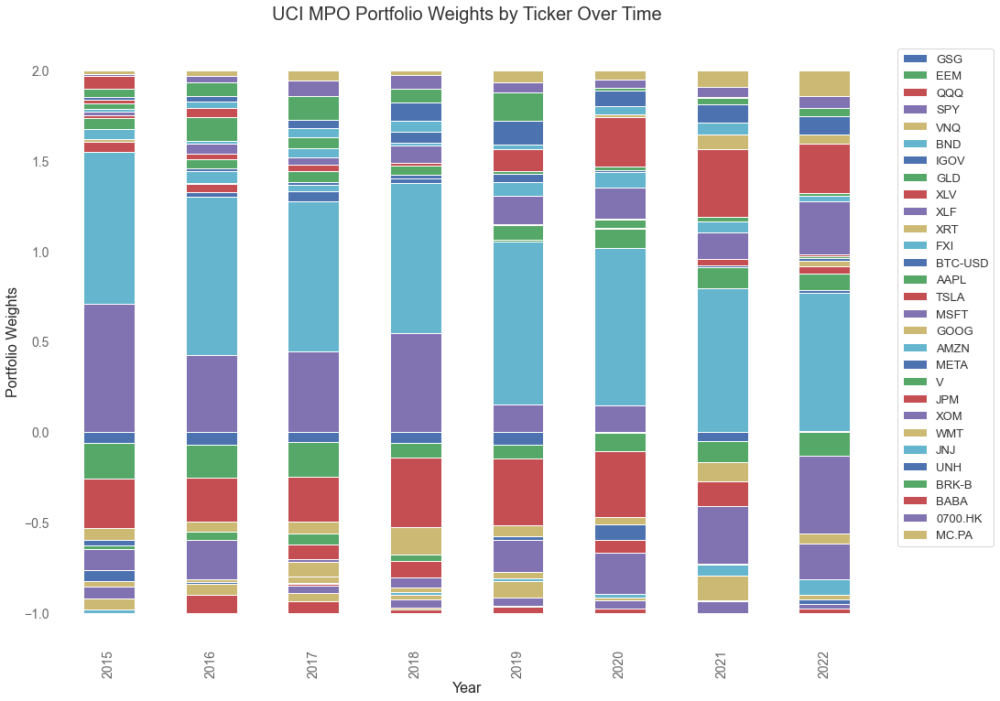

In [172]:
# Plot weights across time: 

# with pandas / plt 
uci_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('UCI MPO Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_uci_mpo_weights = px.bar(uci_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_uci_mpo_weights.update_layout(
    title = 'UCI MPO Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_uci_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_uci_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_uci_mpo_weights.show()

fig_uci_mpo_weights.write_image("UCI_MPO_Weights.png")

### Riskfolio UCI Optimizations - Performance Analysis:

In [173]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
uci_spo_weights = calculate_w(hist_returns, rm='UCI')
uci_spo_returns, uniform_returns = returns_fwd(returns_data_full_period, uci_spo_weights)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo_uci = qs.reports.metrics(uci_mpo_returns, benchmark = uci_spo_returns)
report_mpo_uniform_uci = qs.reports.metrics(uci_mpo_returns, benchmark = uniform_returns)
report_spo_uniform_uci = qs.reports.metrics(uci_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo_uci, report_mpo_uniform_uci, report_spo_uniform_uci)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_uci_mpo_daily = px.line(uci_mpo_returns, title='Daily UCI MPO Portfolio Returns - 2015-2022')
fig_uci_mpo_daily.update_layout(showlegend=False)
fig_uci_mpo_daily.show()

fig_uci_spo_daily = px.line(uci_spo_returns, title='Daily UCI SPO Portfolio Returns - 2015-2022')
fig_uci_spo_daily.update_layout(showlegend=False)
fig_uci_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily UCI Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_uci_cumul_returns_mpo = (1 + uci_mpo_returns).cumprod() * 100
fig_cumul_uci_mpo = px.line(daily_uci_cumul_returns_mpo, title="Cumulative Returns of UCI MPO Portfolio Indexed to 100: 2015-2022")
fig_cumul_uci_mpo.update_layout(showlegend=False)
fig_cumul_uci_mpo.show()

daily_uci_cumul_returns_spo = (1 + uci_spo_returns).cumprod() * 100
fig_cum_uci_spo = px.line(daily_uci_cumul_returns_spo, title="Cumulative Returns of UCI SPO Portfolio Indexed to 100: 2015-2022")
fig_cum_uci_spo.update_layout(showlegend=False)
fig_cum_uci_spo.show()
fig_cum_uci_spo.write_image("UCI_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
uniform_uci_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
uniform_uci_cum.update_layout(showlegend=False)
uniform_uci_cum.show()

Portfolio Stats for 2015:
 Portfolio Annual Return: 4.34%
 PF Annualized Vol: 23.67%
Portfolio Calculated Sharpe Ratio: 0.099


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   52.03%      19.58%
CAGR﹪              5.38%       2.26%

Sharpe              0.7         0.3
Prob. Sharpe Ratio  97.64%      79.81%
Sortino             1.02        0.42
Sortino/√2          0.72        0.3
Omega               1.14        1.14

Max Drawdown        -20.88%     -27.1%
Longest DD Days     724         848

Gain/Pain Ratio     0.14        0.05
Gain/Pain (1M)      0.81        0.26

Payoff Ratio        1.0         0.97
Profit Factor       1.14        1.05
Common Sense Ratio  1.14        0.99
CPC Index           0.6         0.52
Tail Ratio          1.0         0.94
Outlier Win Ratio   3.98

None

None

None

## Riskfolio CDaR (Conditional Drawdown at Risk) Optimization Runs, 2015-2022:

In [174]:

rm = 'CDaR'
full_holding_period = list(price_returns_dict.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
cdar_mpo_weights_df = calculate_w(hist_returns, rm='CDaR')
cdar_mpo_returns, _ = returns_fwd(price_returns_dict['2015']['returns'], cdar_mpo_weights_df)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']    
    cdar_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='CDaR')
    cdar_mpo_weights_df = pd.concat([cdar_mpo_weights_df, cdar_mpo_weights_new], axis=1)
    cdar_pf_returns, _ = returns_fwd(price_returns_dict[f'{year}']['returns'], cdar_mpo_weights_new)
    cdar_mpo_returns = pd.concat([cdar_mpo_returns, cdar_pf_returns])

cols = list(price_returns_dict.keys())[:8]
cdar_mpo_weights_df.columns = cols
cdar_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(cdar_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(cdar_mpo_returns)

daily_cumul_returns_fwd_cdar = (1 + cdar_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_cdar_mpo_cum = px.line(daily_cumul_returns_fwd_cdar, title="Cumulative Returns of CDaR MPO Optimized Portfolio Indexed to 100")
fig_cdar_mpo_cum.update_layout(showlegend=False)
fig_cdar_mpo_cum.show()
fig_cdar_mpo_cum.write_image("CDaR_MPO_cumulative_returns.png")



Portfolio Stats for 2015:
 Portfolio Annual Return: 5.63%
 PF Annualized Vol: 31.07%
Portfolio Calculated Sharpe Ratio: 0.117


Portfolio Stats for 2016:
 Portfolio Annual Return: 4.13%
 PF Annualized Vol: 21.08%
Portfolio Calculated Sharpe Ratio: 0.101


Portfolio Stats for 2017:
 Portfolio Annual Return: 18.90%
 PF Annualized Vol: 91.28%
Portfolio Calculated Sharpe Ratio: 0.185


Portfolio Stats for 2018:
 Portfolio Annual Return: 1.32%
 PF Annualized Vol: 17.55%
Portfolio Calculated Sharpe Ratio: -0.038


Portfolio Stats for 2019:
 Portfolio Annual Return: 15.52%
 PF Annualized Vol: 86.00%
Portfolio Calculated Sharpe Ratio: 0.157


Portfolio Stats for 2020:
 Portfolio Annual Return: 14.68%
 PF Annualized Vol: 63.62%
Portfolio Calculated Sharpe Ratio: 0.199


Portfolio Stats for 2021:
 Portfolio Annual Return: -4.83%
 PF Annualized Vol: 28.55%
Portfolio Calculated Sharpe Ratio: -0.239


Portfolio Stats for 2022:
 Portfolio Annual Return: -9.88%
 PF Annualized Vol: 54.41%
Portfolio Ca

,2015,2016,2017,2018,2019,2020,2021,2022
GSG,-6.4644%,-6.3938%,-5.4789%,-7.5247%,-7.7111%,-1.3741%,-4.7405%,-1.2259%
EEM,-19.3654%,-17.9452%,-17.2309%,-3.7084%,-7.1203%,-7.2860%,-14.8734%,-14.3587%
QQQ,-33.6641%,-23.1947%,-18.3389%,-36.9581%,-37.1664%,-34.6408%,-0.0000%,-0.0000%
SPY,69.7022%,20.5746%,33.9067%,38.0810%,18.5073%,21.9582%,-0.0000%,-46.0405%
VNQ,-4.0182%,-7.5913%,-9.5725%,-19.4291%,-7.9961%,-4.5579%,-12.1097%,-10.6109%
BND,73.5336%,89.9988%,81.9260%,86.0908%,93.8832%,90.3928%,74.9726%,80.1733%
IGOV,-1.4146%,3.8668%,10.8319%,7.5533%,-1.9066%,-8.5803%,8.2526%,0.0000%
GLD,-3.1524%,-5.8181%,-6.0479%,-5.6193%,1.1893%,9.4707%,12.3055%,11.7113%
XLV,7.9202%,7.6827%,-12.5775%,-6.1822%,0.7217%,-11.3786%,-11.2095%,0.4897%
XLF,-11.9092%,-20.0272%,-2.2683%,-0.1406%,-21.6097%,-20.3917%,-34.0615%,-13.8526%


Portfolio Daily Returns Using CDaR as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,-0.2378%
2015-01-06,0.2787%
2015-01-07,0.1603%
2015-01-08,1.0821%
2015-01-09,-0.5180%
...,...
2022-12-23,-0.5635%
2022-12-27,-0.8469%
2022-12-28,0.6586%


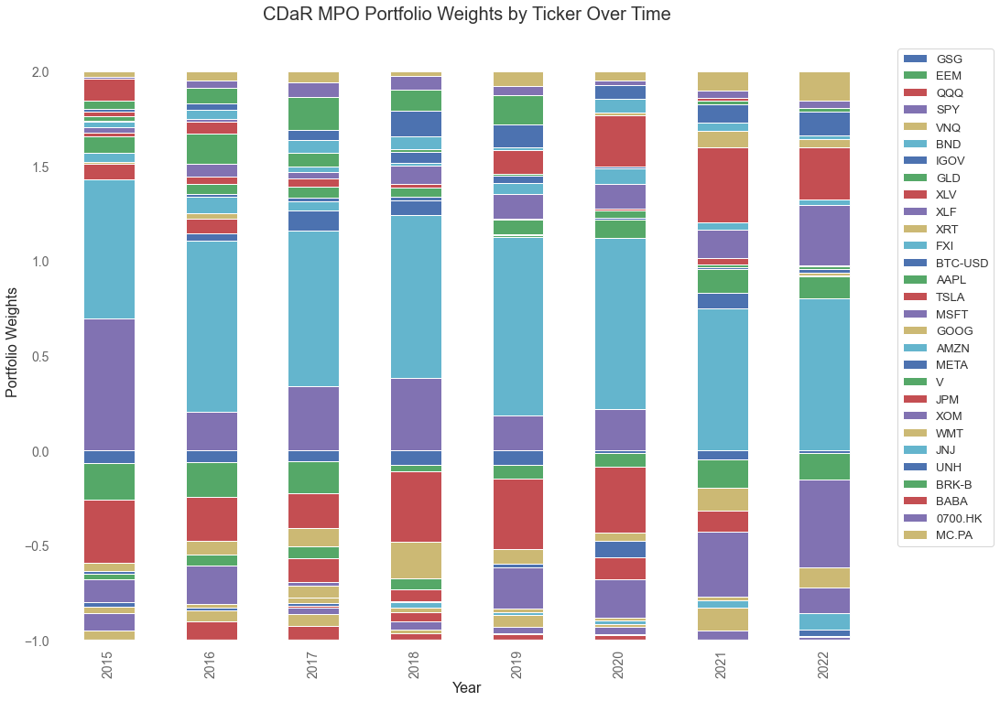

In [175]:
# Plot weights across time: 

# with pandas / plt 
cdar_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('CDaR MPO Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_cdar_mpo_weights = px.bar(cdar_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_cdar_mpo_weights.update_layout(
    title = 'CDaR MPO Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_cdar_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_cdar_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_cdar_mpo_weights.show()

fig_cdar_mpo_weights.write_image("CDaR_MPO_Weights.png")

### Riskfolio CDaR Optimizations - Performance Analysis:

In [176]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
cdar_spo_weights = calculate_w(hist_returns, rm='CDaR')
cdar_spo_returns, uniform_returns = returns_fwd(returns_data_full_period, cdar_spo_weights)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo_cdar = qs.reports.metrics(cdar_mpo_returns, benchmark = cdar_spo_returns)
report_mpo_uniform_cdar = qs.reports.metrics(cdar_mpo_returns, benchmark = uniform_returns)
report_spo_uniform_cdar = qs.reports.metrics(cdar_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo_cdar, report_mpo_uniform_cdar, report_spo_uniform_cdar)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_cdar_mpo_daily = px.line(uci_mpo_returns, title='Daily CDaR MPO Portfolio Returns - 2015-2022')
fig_cdar_mpo_daily.update_layout(showlegend=False)
fig_cdar_mpo_daily.show()

fig_cdar_spo_daily = px.line(uci_spo_returns, title='Daily CDaR SPO Portfolio Returns - 2015-2022')
fig_cdar_spo_daily.update_layout(showlegend=False)
fig_cdar_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily CDaR Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_cdar_cumul_returns_mpo = (1 + cdar_mpo_returns).cumprod() * 100
fig_cumul_cdar_mpo = px.line(daily_cdar_cumul_returns_mpo, title="Cumulative Returns of CDaR MPO Portfolio Indexed to 100: 2015-2022")
fig_cumul_cdar_mpo.update_layout(showlegend=False)
fig_cumul_cdar_mpo.show()

daily_cdar_cumul_returns_spo = (1 + cdar_spo_returns).cumprod() * 100
fig_cum_cdar_spo = px.line(daily_cdar_cumul_returns_spo, title="Cumulative Returns of CDaR SPO Portfolio Indexed to 100: 2015-2022")
fig_cum_cdar_spo.update_layout(showlegend=False)
fig_cum_cdar_spo.show()
fig_cum_cdar_spo.write_image("CDaR_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
uniform_cdar_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
uniform_cdar_cum.update_layout(showlegend=False)
uniform_cdar_cum.show()

Portfolio Stats for 2015:
 Portfolio Annual Return: 5.63%
 PF Annualized Vol: 31.07%
Portfolio Calculated Sharpe Ratio: 0.117


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   50.55%      42.18%
CAGR﹪              5.25%       4.5%

Sharpe              0.68        0.5
Prob. Sharpe Ratio  97.27%      92.14%
Sortino             0.99        0.73
Sortino/√2          0.7         0.51
Omega               1.13        1.13

Max Drawdown        -20.95%     -31.86%
Longest DD Days     724         808

Gain/Pain Ratio     0.13        0.09
Gain/Pain (1M)      0.78        0.5

Payoff Ratio        0.98        0.96
Profit Factor       1.13        1.09
Common Sense Ratio  1.12        1.02
CPC Index           0.58        0.56
Tail Ratio          0.99        0.93
Outlier Win Ratio   4.36

None

None

None

# Portfolio & Risk-Measure Comparison Analysis: 

In [177]:
def calc_uniform_stats(returns=uniform_returns, days=252):
    port_stats_dict['uniform']['pf_annualized_return'] = np.mean(returns) * days
    port_stats_dict['uniform']['pf_cumulative_return'] = ((1 + returns).cumprod() - 1).iloc[-1]
    port_stats_dict['uniform']['pf_annualized_volatility'] = returns.std() * np.sqrt(days)
    port_stats_dict['uniform']['pf_cumulative_volatility'] = returns.std() * np.sqrt(days * 8)
    port_stats_dict['uniform']['pf_Sharpe_annual'] = ((np.mean(returns) * days) - 0.02) / (returns.std() * np.sqrt(days))
    cum_compounded_rf = (1.02 ** 8) - 1
    port_stats_dict['uniform']['pf_Sharpe_cumulative'] = ((((1 + returns).cumprod() - 1).iloc[-1]) - cum_compounded_rf) / (returns.std() * np.sqrt(days * 8))

def calc_pf_returns(returns=cvar_mpo_returns, days=252):
    avg_annual = (np.mean(returns) * days).get(0)
    cum_returns = ((1 + returns).cumprod() - 1).iloc[-1].get(0)
    return avg_annual, cum_returns

def calc_pf_volatility(returns=cvar_mpo_returns, days=252):
    avg_annual = (returns.std() * np.sqrt(days)).get(0)
    total_period_vol = (returns.std() * np.sqrt(days * 8)).get(0)
    return avg_annual, total_period_vol

def calc_pf_sharpe(returns, volatility, risk_free_rate):
    return (returns - risk_free_rate) / volatility

# weights_list = 
port_stats_dict = defaultdict(lambda: defaultdict(int)) 
portfolio_list = ['cvar_mpo', 'cvar_spo', 'mv_mpo', 'mv_spo', 'mdd_mpo', 'mdd_spo', 'mad_mpo', 'mad_spo', 'flpm_mpo', 'flpm_spo', 
                  'uci_mpo', 'uci_spo', 'cdar_mpo', 'cdar_spo']
returns_list = [cvar_mpo_returns, cvar_spo_returns, mv_mpo_returns, mv_spo_returns, mdd_mpo_returns, mdd_spo_returns, 
                mad_mpo_returns, mad_spo_returns, flpm_mpo_returns, flpm_spo_returns, uci_mpo_returns, uci_spo_returns,
                cdar_mpo_returns, cdar_spo_returns]
for i, portfolio in enumerate(portfolio_list):
    ann_return, cum_return = calc_pf_returns(returns_list[i])
    ann_vol, cum_vol = calc_pf_volatility(returns_list[i])
    port_stats_dict[portfolio]['pf_annualized_return'] = ann_return
    port_stats_dict[portfolio]['pf_cumulative_return'] = cum_return
    port_stats_dict[portfolio]['pf_annualized_volatility'] = ann_vol
    port_stats_dict[portfolio]['pf_cumulative_volatility'] = cum_vol
    port_stats_dict[portfolio]['pf_Sharpe_annual'] = calc_pf_sharpe(ann_return, ann_vol, risk_free_rate=0.02)
    cumulative_compounded_rf = (1.02 ** 8) - 1
    port_stats_dict[portfolio]['pf_Sharpe_cumulative'] = calc_pf_sharpe(cum_return, cum_vol, risk_free_rate=cumulative_compounded_rf)
    
calc_uniform_stats()

# volatility = np.sqrt(np.dot(weights.T, np.dot(cov_annual, weights)))

In [199]:
perf_df = pd.DataFrame.from_dict(port_stats_dict, orient='index')
perf_df.index.name = 'Portfolio'
display(perf_df)
dfi.export(perf_df.style.format("{:.3f}").background_gradient(cmap='PiYG'), 'perf_df.png')
# list(port_stats_dict.items())

,pf_annualized_return,pf_cumulative_return,pf_annualized_volatility,pf_cumulative_volatility,pf_Sharpe_annual,pf_Sharpe_cumulative
Portfolio,,,,,,
cvar_mpo,0.026562,0.198442,0.087449,0.247344,0.075040,0.108281
cvar_spo,0.042943,0.366439,0.087857,0.248497,0.261142,0.783833
mv_mpo,0.035292,0.285929,0.086027,0.243320,0.177756,0.469628
mv_spo,0.042339,0.373911,0.071685,0.202757,0.311631,0.997509
mdd_mpo,0.042164,0.349617,0.094856,0.268295,0.233655,0.663293
mdd_spo,0.061653,0.548646,0.117567,0.332529,0.354289,1.133694
mad_mpo,0.049818,0.450099,0.079146,0.223858,0.376742,1.243819
mad_spo,0.032184,0.262635,0.077348,0.218774,0.157526,0.415844
flpm_mpo,0.048649,0.436370,0.079486,0.224820,0.360427,1.177432


In [179]:
perf_df_mpo = perf_df.iloc[[0,2,4,6,8,10,12], :]
perf_df_spo = perf_df.iloc[[1,3,5,7,9,11,13], :]
perf_df_mpo_spo = pd.concat([perf_df_mpo, perf_df_spo])

fig_sharpe_comp_mpo_spo = px.bar(perf_df_mpo_spo[['pf_Sharpe_annual','pf_Sharpe_cumulative']].transpose(), color_continuous_scale=px.colors.diverging.BrBG)

fig_sharpe_comp_mpo_spo.update_layout(
    title = 'Sharpe Ratio Comparison Between MPO & SPO Portfolios with Various Risk Measures',
    barmode = 'group',
    xaxis_title='Performance Metric',
    yaxis_title='Score',
    legend_title='Risk_Measure_Period_PFs',
    yaxis=dict(range=[-1, 2], dtick=0.1),
    showlegend=True,
    height=700,
    width=1300,
)

fig_sharpe_comp_mpo_spo.update_xaxes(showgrid=True, showline=True)
fig_sharpe_comp_mpo_spo.update_yaxes(showgrid=True, showline=True)

fig_sharpe_comp_mpo_spo.show()

fig_sharpe_comp_mpo_spo.write_image("Performance_Comparison_Sharpes - MPO vs. SPO.png")


In [180]:

fig_perf_comp = px.bar(perf_df.transpose(), color_continuous_scale=px.colors.diverging.BrBG)

fig_perf_comp.update_layout(
    title = 'Performance Comparison Between MPO, SPO, Uniform, and Risk Measures',
    barmode = 'group',
    xaxis_title='Performance Metric',
    yaxis_title='Score',
    legend_title='Risk Measures & Period',
    yaxis=dict(range=[-1, 2], dtick=0.1),
    showlegend=True,
    height=800,
    width=1400,
)

fig_perf_comp.update_xaxes(showgrid=True, showline=True)
fig_perf_comp.update_yaxes(showgrid=True, showline=True)

fig_perf_comp.show()

fig_perf_comp.write_image("Performance_Comparison.png")



fig_sharpe_comp = px.bar(perf_df[['pf_Sharpe_annual','pf_Sharpe_cumulative']].transpose(), color_continuous_scale=px.colors.diverging.BrBG)

fig_sharpe_comp.update_layout(
    title = 'Sharpe Ratio Comparison Between MPO, SPO, Uniform, and Risk Measures',
    barmode = 'group',
    xaxis_title='Performance Metric',
    yaxis_title='Score',
    legend_title='Risk Measures & Period',
    yaxis=dict(range=[-1, 2], dtick=0.1),
    showlegend=True,
    height=800,
    width=1400,
)

fig_sharpe_comp.update_xaxes(showgrid=True, showline=True)
fig_sharpe_comp.update_yaxes(showgrid=True, showline=True)

fig_sharpe_comp.show()

fig_sharpe_comp.write_image("Performance_Comparison_Sharpes.png")

## Portfolio Plotting - Weights by Risk Measure by Year

In [181]:
#Plotting: 
def calc_w_rms(returns=hist_returns):
    port = rp.Portfolio(returns=returns)

    # Select method and estimate input parameters:
    method_mu='hist' # Method to estimate expected returns based on historical data. 
    method_cov='hist' # Method to estimate covariance matrix based on historical data.
    port.assets_stats (method_mu=method_mu, method_cov=method_cov, d=0.94)

    # Constraints configuration:
    port.sht = True     # bool for allowing short positions (negative weights)
    port.uppersht = 1   # max sum of short weights 
    port.upperlng = 2 # max sum of long weights
    port.budget = 1   # port.upperlng - port.uppersht 

    # Estimate optimal portfolio:
    model='Classic' # Could be Classic (historical), BL (Black Litterman) or FM (Factor Model)
    obj = 'Sharpe' # Objective function, could be MinRisk, MaxRet, Utility or Sharpe
    hist = True # Use historical scenarios for risk measures that depend on scenarios
    rf = 0 # Risk free rate
    l = 0 # Risk aversion factor, only useful when obj is 'Utility'
    
    rms = ['CVaR', 'MV', 'MDD', 'MAD', 'FLPM', 'UCI', 'CDaR']
    w_s = pd.DataFrame([])

    for i in rms:
        w_rm = port.optimization(model=model, rm=i, obj=obj, rf=rf, l=l, hist=hist)
        w_s = pd.concat([w_s, w_rm], axis=1)
        
    w_s.columns = rms
    # w_s.style.format("{:.2%}").background_gradient(cmap='YlGn')
    # display(w_s)

    return w_s
    # return w, w_s, frontier, cov, port_returns


In [201]:
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr_rms = price_returns_dict_companies[multiyr_periods_list_companies[i]]['returns']
    rm_ws = calc_w_rms(returns=daily_returns_last_5yr_rms)
    print(f'weights by risk measure for {year}:\n')
    display(rm_ws.style.format("{:.2%}").background_gradient(cmap='YlGn'))
    dfi.export(rm_ws.style.format("{:.2%}").background_gradient(cmap='YlGn'), f'rm_ws_{year}.png')

weights by risk measure for 2016:



,CVaR,MV,MDD,MAD,FLPM,UCI,CDaR
AAPL,0.84%,6.82%,13.52%,5.87%,4.46%,18.53%,23.30%
TSLA,12.53%,10.38%,6.90%,9.68%,9.72%,9.54%,8.59%
MSFT,4.67%,11.89%,-0.00%,9.67%,10.72%,21.21%,24.66%
GOOG,-0.00%,2.48%,-4.57%,1.01%,1.79%,2.84%,0.00%
AMZN,3.83%,1.43%,-0.00%,1.67%,0.40%,-4.76%,-5.46%
META,8.91%,6.52%,-0.00%,5.82%,6.79%,-2.77%,1.77%
V,61.81%,51.70%,65.40%,61.83%,61.97%,73.47%,65.94%
JPM,-20.76%,-16.50%,-48.01%,-18.68%,-18.61%,-28.56%,-32.09%
XOM,-47.93%,-39.49%,-36.60%,-33.98%,-37.56%,-24.42%,-29.26%
WMT,-9.13%,-1.82%,-0.00%,-1.97%,-2.65%,-3.17%,3.09%


weights by risk measure for 2017:



,CVaR,MV,MDD,MAD,FLPM,UCI,CDaR
AAPL,-0.00%,2.68%,0.00%,3.24%,5.68%,0.94%,5.18%
TSLA,9.09%,7.62%,-1.12%,5.41%,5.59%,0.40%,2.35%
MSFT,5.74%,9.83%,0.00%,12.21%,13.04%,19.81%,18.10%
GOOG,-12.25%,-4.22%,-17.22%,-3.29%,-1.97%,-17.30%,-16.56%
AMZN,9.16%,11.72%,3.83%,11.38%,9.67%,13.96%,5.92%
META,-0.00%,0.56%,-0.76%,0.00%,0.09%,-3.87%,-1.96%
V,19.16%,18.90%,25.33%,21.98%,19.38%,33.17%,21.38%
JPM,2.47%,7.93%,-14.68%,12.59%,8.31%,-18.35%,-15.87%
XOM,-45.56%,-43.75%,-31.57%,-42.65%,-39.46%,-28.90%,-29.87%
WMT,-10.36%,-14.74%,-0.24%,-10.46%,-14.57%,-3.20%,-1.73%


weights by risk measure for 2018:



,CVaR,MV,MDD,MAD,FLPM,UCI,CDaR
AAPL,-8.99%,-0.20%,11.76%,1.36%,-0.26%,4.77%,11.69%
TSLA,3.49%,6.43%,-1.44%,6.09%,5.12%,-4.08%,-4.30%
MSFT,17.80%,16.18%,10.19%,18.32%,16.90%,24.82%,26.68%
GOOG,-18.11%,-6.65%,-1.74%,-7.96%,-5.03%,-19.43%,-15.69%
AMZN,13.04%,6.78%,0.00%,5.34%,5.99%,10.35%,3.28%
META,17.62%,10.50%,1.53%,12.49%,12.01%,13.39%,15.84%
V,-1.61%,5.94%,0.00%,6.97%,4.65%,-0.27%,0.00%
JPM,-11.56%,6.82%,-20.03%,8.45%,8.10%,-14.28%,-24.34%
XOM,-44.31%,-40.88%,-51.92%,-31.58%,-31.74%,-22.06%,-27.69%
WMT,0.03%,-0.45%,0.00%,1.60%,1.67%,-3.35%,-1.12%


weights by risk measure for 2019:



,CVaR,MV,MDD,MAD,FLPM,UCI,CDaR
AAPL,-0.00%,1.53%,14.25%,3.26%,2.60%,6.04%,2.60%
TSLA,-2.42%,-0.00%,-6.02%,0.17%,0.00%,-5.79%,-7.42%
MSFT,33.07%,33.15%,25.52%,46.28%,48.80%,42.67%,42.14%
GOOG,-17.59%,-22.10%,-0.00%,-30.35%,-30.84%,-28.36%,-7.50%
AMZN,22.23%,17.86%,-0.00%,18.65%,20.10%,5.98%,-0.00%
META,-0.00%,1.32%,-0.00%,2.96%,0.06%,7.55%,6.33%
V,0.00%,13.95%,0.00%,15.14%,10.23%,19.30%,14.89%
JPM,0.00%,0.00%,-14.33%,2.39%,0.00%,-6.73%,-14.19%
XOM,-65.99%,-60.83%,-50.61%,-54.52%,-53.40%,-33.28%,-42.43%
WMT,0.00%,-0.00%,-0.00%,-0.00%,-0.17%,0.00%,0.00%


weights by risk measure for 2020:



,CVaR,MV,MDD,MAD,FLPM,UCI,CDaR
AAPL,1.80%,3.82%,6.48%,3.80%,2.44%,1.31%,0.00%
TSLA,-8.25%,-3.43%,-13.03%,-3.48%,-3.15%,-6.48%,-12.57%
MSFT,17.12%,18.06%,31.63%,26.70%,25.78%,52.65%,42.76%
GOOG,-2.32%,-6.85%,0.00%,-7.05%,-5.10%,-8.17%,1.86%
AMZN,41.13%,30.35%,-0.00%,35.78%,37.71%,13.18%,4.96%
META,-10.98%,-0.29%,-0.00%,-6.33%,-7.11%,-6.70%,-0.15%
V,0.00%,14.42%,33.89%,11.32%,11.35%,34.26%,33.85%
JPM,18.11%,32.61%,-0.00%,35.85%,36.17%,10.17%,7.79%
XOM,-40.67%,-44.06%,-56.74%,-38.13%,-35.82%,-46.73%,-54.53%
WMT,2.60%,9.02%,9.04%,8.11%,8.46%,8.87%,15.41%


weights by risk measure for 2021:



,CVaR,MV,MDD,MAD,FLPM,UCI,CDaR
AAPL,11.82%,21.66%,0.00%,23.65%,23.48%,2.65%,0.00%
TSLA,10.03%,10.54%,1.23%,8.92%,8.17%,7.41%,7.74%
MSFT,1.75%,3.10%,49.93%,11.72%,9.76%,29.72%,31.77%
GOOG,-4.77%,-23.46%,-25.43%,-28.75%,-26.53%,-26.05%,-23.75%
AMZN,17.22%,25.33%,1.16%,19.55%,22.41%,8.12%,12.42%
META,-8.42%,-6.24%,0.00%,-6.02%,-5.57%,-7.35%,-5.86%
V,11.39%,5.95%,-0.00%,11.71%,4.97%,25.05%,7.42%
JPM,18.17%,13.73%,10.82%,18.36%,20.80%,4.02%,5.57%
XOM,-52.74%,-60.05%,-58.16%,-46.00%,-48.15%,-54.41%,-54.04%
WMT,40.40%,30.26%,34.58%,31.74%,33.70%,21.29%,22.89%


weights by risk measure for 2022:



,CVaR,MV,MDD,MAD,FLPM,UCI,CDaR
AAPL,10.11%,27.08%,0.00%,24.55%,28.18%,-1.02%,0.00%
TSLA,15.31%,13.95%,-5.64%,11.71%,12.16%,3.16%,-1.37%
MSFT,15.67%,30.38%,57.86%,40.04%,38.94%,84.20%,60.08%
GOOG,25.30%,7.84%,12.04%,-1.56%,-1.06%,1.41%,12.61%
AMZN,16.54%,9.20%,-0.00%,5.83%,3.60%,-6.57%,0.00%
META,-18.21%,-11.55%,-27.68%,-6.85%,-11.29%,-11.52%,-27.24%
V,-0.00%,-5.31%,-0.00%,-5.72%,-5.48%,-1.97%,-0.00%
JPM,0.00%,3.85%,-9.10%,17.12%,17.00%,16.86%,12.89%
XOM,-47.96%,-45.17%,-34.78%,-32.01%,-32.92%,-46.91%,-41.50%
WMT,36.92%,23.71%,30.41%,25.76%,21.64%,18.01%,25.98%


# MAD Optimization on Companies' Stocks Only - 2015-2022: 

In [191]:

rm = 'MAD'
full_holding_period = list(price_returns_dict_companies.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
mad_mpo_weights_df = calculate_w(hist_returns_companies, rm='MAD', companies=True)
mad_mpo_returns, _ = returns_fwd(price_returns_dict_companies['2015']['returns'], mad_mpo_weights_df, companies=True)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict_companies[multiyr_periods_list_companies[i]]['returns']    
    mad_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='MAD', companies=True)
    mad_mpo_weights_df = pd.concat([mad_mpo_weights_df, mad_mpo_weights_new], axis=1)
    mad_pf_returns, _ = returns_fwd(price_returns_dict_companies[f'{year}']['returns'], mad_mpo_weights_new, companies=True)
    mad_mpo_returns = pd.concat([mad_mpo_returns, mad_pf_returns])

cols = list(price_returns_dict_companies.keys())[:8]
mad_mpo_weights_df.columns = cols
mad_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(mad_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(mad_mpo_returns)

daily_cumul_returns_fwd_mad = (1 + mad_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_mad_mpo_cum = px.line(daily_cumul_returns_fwd_mad, title="Cumulative Returns of MAD MPO Optimized Portfolio Indexed to 100")
fig_mad_mpo_cum.update_layout(showlegend=False)
fig_mad_mpo_cum.show()
fig_mad_mpo_cum.write_image("MAD_Companies_MPO_cumulative_returns.png")



(252, 16) (16, 1)
Portfolio Stats for 2015:
 Portfolio Annual Return: -8.46%
 PF Annualized Vol: 93.70%
Portfolio Calculated Sharpe Ratio: -0.112


(252, 16) (16, 1)
Portfolio Stats for 2016:
 Portfolio Annual Return: 8.92%
 PF Annualized Vol: 137.74%
Portfolio Calculated Sharpe Ratio: 0.050


(251, 16) (16, 1)
Portfolio Stats for 2017:
 Portfolio Annual Return: 61.28%
 PF Annualized Vol: 262.41%
Portfolio Calculated Sharpe Ratio: 0.226


(251, 16) (16, 1)
Portfolio Stats for 2018:
 Portfolio Annual Return: 2.23%
 PF Annualized Vol: 55.94%
Portfolio Calculated Sharpe Ratio: 0.004


(252, 16) (16, 1)
Portfolio Stats for 2019:
 Portfolio Annual Return: 43.35%
 PF Annualized Vol: 167.39%
Portfolio Calculated Sharpe Ratio: 0.247


(253, 16) (16, 1)
Portfolio Stats for 2020:
 Portfolio Annual Return: 62.36%
 PF Annualized Vol: 318.71%
Portfolio Calculated Sharpe Ratio: 0.189


(252, 16) (16, 1)
Portfolio Stats for 2021:
 Portfolio Annual Return: -2.25%
 PF Annualized Vol: 77.82%
Portfolio C

,2015,2016,2017,2018,2019,2020,2021,2022
AAPL,20.9562%,5.8716%,3.2381%,1.3563%,3.2593%,3.7967%,23.6509%,24.5500%
TSLA,7.0069%,9.6844%,5.4137%,6.0940%,0.1723%,-3.4836%,8.9184%,11.7148%
MSFT,-0.6243%,9.6750%,12.2094%,18.3226%,46.2755%,26.7032%,11.7204%,40.0444%
GOOG,-14.2116%,1.0102%,-3.2907%,-7.9586%,-30.3519%,-7.0480%,-28.7541%,-1.5631%
AMZN,-2.3016%,1.6659%,11.3757%,5.3378%,18.6544%,35.7838%,19.5518%,5.8347%
META,4.4514%,5.8227%,0.0000%,12.4938%,2.9554%,-6.3264%,-6.0210%,-6.8525%
V,13.9136%,61.8300%,21.9750%,6.9677%,15.1444%,11.3247%,11.7063%,-5.7238%
JPM,-17.9434%,-18.6828%,12.5855%,8.4513%,2.3949%,35.8524%,18.3599%,17.1164%
XOM,-23.7685%,-33.9814%,-42.6521%,-31.5815%,-54.5193%,-38.1321%,-45.9999%,-32.0138%
WMT,24.3346%,-1.9709%,-10.4563%,1.5972%,-0.0000%,8.1073%,31.7439%,25.7592%


Portfolio Daily Returns Using MAD as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,-0.6491%
2015-01-06,1.9505%
2015-01-07,2.3108%
2015-01-08,2.7702%
2015-01-09,-1.0263%
...,...
2022-12-23,-0.9120%
2022-12-27,-2.9540%
2022-12-28,0.0818%


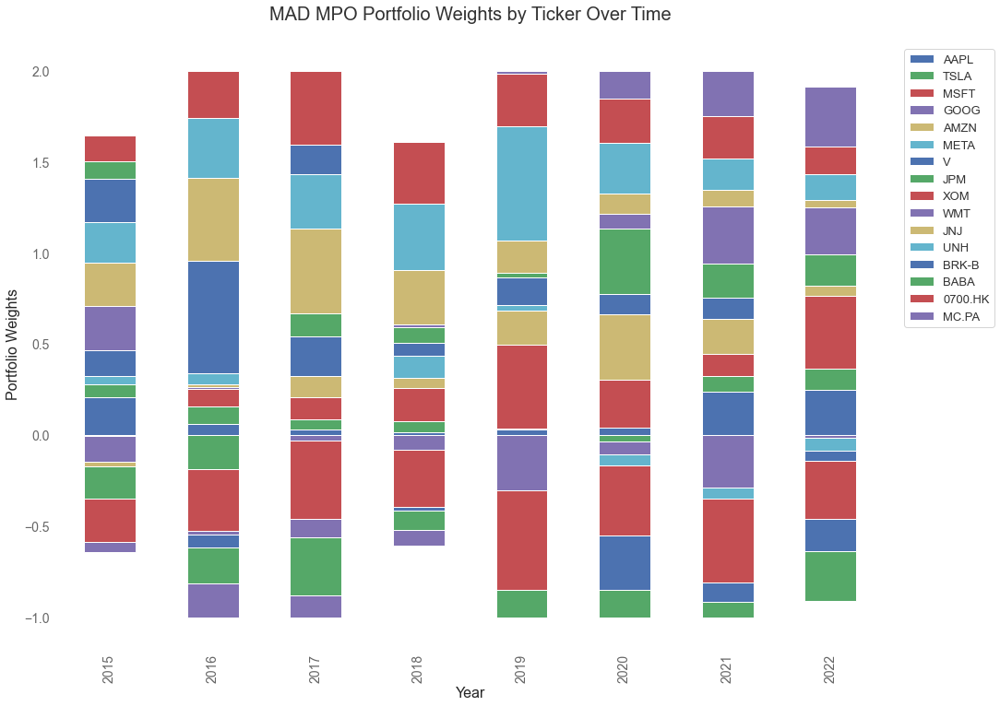

In [192]:
# Plot weights across time: 

# with pandas / plt 
mad_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('MAD MPO Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_mad_mpo_weights = px.bar(mad_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_mad_mpo_weights.update_layout(
    title = 'MAD MPO Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_mad_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_mad_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_mad_mpo_weights.show()

fig_mad_mpo_weights.write_image("MAD_MPO_Weights.png")

In [193]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
mad_spo_weights = calculate_w(hist_returns_companies, rm='MAD', companies=True)
mad_spo_returns, uniform_returns = returns_fwd(returns_data_full_period_companies, mad_spo_weights, companies=True)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo_mad = qs.reports.metrics(mad_mpo_returns, benchmark = mad_spo_returns)
report_mpo_uniform_mad = qs.reports.metrics(mad_mpo_returns, benchmark = uniform_returns)
report_spo_uniform_mad = qs.reports.metrics(mad_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo_mad, report_mpo_uniform_mad, report_spo_uniform_mad)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_mad_mpo_daily = px.line(mad_mpo_returns, title='Daily MAD MPO Portfolio Returns - 2015-2022')
fig_mad_mpo_daily.update_layout(showlegend=False)
fig_mad_mpo_daily.show()

fig_mad_spo_daily = px.line(mad_spo_returns, title='Daily MAD SPO Portfolio Returns - 2015-2022')
fig_mad_spo_daily.update_layout(showlegend=False)
fig_mad_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily MAD Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_mad_cumul_returns_mpo = (1 + mad_mpo_returns).cumprod() * 100
fig_cumul_mad_mpo = px.line(daily_mad_cumul_returns_mpo, title="Cumulative Returns of MAD MPO Portfolio Indexed to 100: 2015-2022")
fig_cumul_mad_mpo.update_layout(showlegend=False)
fig_cumul_mad_mpo.show()

daily_mad_cumul_returns_spo = (1 + mad_spo_returns).cumprod() * 100
fig_cum_mad_spo = px.line(daily_mad_cumul_returns_spo, title="Cumulative Returns of MAD SPO Portfolio Indexed to 100: 2015-2022")
fig_cum_mad_spo.update_layout(showlegend=False)
fig_cum_mad_spo.show()
fig_cum_mad_spo.write_image("MAD_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
uniform_mad_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
uniform_mad_cum.update_layout(showlegend=False)
uniform_mad_cum.show()

(252, 16) (16, 1)
Portfolio Stats for 2015:
 Portfolio Annual Return: -8.46%
 PF Annualized Vol: 93.70%
Portfolio Calculated Sharpe Ratio: -0.112


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   115.96%     160.52%
CAGR﹪              10.12%      12.73%

Sharpe              0.52        0.71
Prob. Sharpe Ratio  92.99%      97.66%
Sortino             0.76        1.01
Sortino/√2          0.53        0.72
Omega               1.1         1.1

Max Drawdown        -46.57%     -38.14%
Longest DD Days     702         808

Gain/Pain Ratio     0.1         0.13
Gain/Pain (1M)      0.54        0.75

Payoff Ratio        0.97        0.95
Profit Factor       1.1         1.13
Common Sense Ratio  1.09        1.09
CPC Index           0.56        0.57
Tail Ratio          0.99        0.96


None

None

None

# Riskfolio UCI (Ulcer Index) Optimization Runs - COMPANIES ONLY, 2015-2022:


In [202]:

rm = 'UCI'
full_holding_period = list(price_returns_dict_companies.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
uci_mpo_weights_df = calculate_w(hist_returns_companies, rm='UCI', companies=True)
uci_mpo_returns, _ = returns_fwd(price_returns_dict_companies['2015']['returns'], uci_mpo_weights_df, companies=True)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict_companies[multiyr_periods_list_companies[i]]['returns']    
    uci_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='UCI', companies=True)
    uci_mpo_weights_df = pd.concat([uci_mpo_weights_df, uci_mpo_weights_new], axis=1)
    uci_pf_returns, _ = returns_fwd(price_returns_dict_companies[f'{year}']['returns'], uci_mpo_weights_new, companies=True)
    uci_mpo_returns = pd.concat([uci_mpo_returns, uci_pf_returns])

cols = list(price_returns_dict_companies.keys())[:8]
uci_mpo_weights_df.columns = cols
uci_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(uci_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(uci_mpo_returns)

daily_cumul_returns_fwd_uci = (1 + uci_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_uci_mpo_cum = px.line(daily_cumul_returns_fwd_uci, title="Cumulative Returns of UCI Companies-Only MPO Optimized Portfolio Indexed to 100")
fig_uci_mpo_cum.update_layout(showlegend=False)
fig_uci_mpo_cum.show()
fig_uci_mpo_cum.write_image("UCI_Companies_MPO_cumulative_returns.png")



(252, 16) (16, 1)
Portfolio Stats for 2015:
 Portfolio Annual Return: -0.63%
 PF Annualized Vol: 62.20%
Portfolio Calculated Sharpe Ratio: -0.042


(252, 16) (16, 1)
Portfolio Stats for 2016:
 Portfolio Annual Return: 2.13%
 PF Annualized Vol: 68.03%
Portfolio Calculated Sharpe Ratio: 0.002


(251, 16) (16, 1)
Portfolio Stats for 2017:
 Portfolio Annual Return: 50.36%
 PF Annualized Vol: 214.05%
Portfolio Calculated Sharpe Ratio: 0.226


(251, 16) (16, 1)
Portfolio Stats for 2018:
 Portfolio Annual Return: 8.17%
 PF Annualized Vol: 64.78%
Portfolio Calculated Sharpe Ratio: 0.095


(252, 16) (16, 1)
Portfolio Stats for 2019:
 Portfolio Annual Return: 39.02%
 PF Annualized Vol: 162.36%
Portfolio Calculated Sharpe Ratio: 0.228


(253, 16) (16, 1)
Portfolio Stats for 2020:
 Portfolio Annual Return: 54.40%
 PF Annualized Vol: 258.42%
Portfolio Calculated Sharpe Ratio: 0.203


(252, 16) (16, 1)
Portfolio Stats for 2021:
 Portfolio Annual Return: 1.19%
 PF Annualized Vol: 70.09%
Portfolio Cal

,2015,2016,2017,2018,2019,2020,2021,2022
AAPL,22.8381%,18.5306%,0.9430%,4.7712%,6.0392%,1.3082%,2.6478%,-1.0235%
TSLA,6.4181%,9.5368%,0.3962%,-4.0803%,-5.7906%,-6.4813%,7.4090%,3.1600%
MSFT,-11.2654%,21.2142%,19.8108%,24.8234%,42.6712%,52.6475%,29.7241%,84.1957%
GOOG,-1.5454%,2.8422%,-17.3045%,-19.4326%,-28.3565%,-8.1694%,-26.0524%,1.4081%
AMZN,1.9551%,-4.7584%,13.9611%,10.3469%,5.9823%,13.1811%,8.1213%,-6.5704%
META,4.8357%,-2.7692%,-3.8661%,13.3950%,7.5537%,-6.6965%,-7.3531%,-11.5209%
V,7.1924%,73.4698%,33.1700%,-0.2700%,19.3032%,34.2591%,25.0475%,-1.9652%
JPM,-10.4406%,-28.5643%,-18.3461%,-14.2794%,-6.7254%,10.1745%,4.0220%,16.8561%
XOM,-20.9410%,-24.4153%,-28.8990%,-22.0626%,-33.2828%,-46.7273%,-54.4083%,-46.9116%
WMT,18.6437%,-3.1704%,-3.2031%,-3.3533%,0.0000%,8.8744%,21.2852%,18.0108%


Portfolio Daily Returns Using UCI as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,-1.1914%
2015-01-06,0.6606%
2015-01-07,1.8870%
2015-01-08,2.4395%
2015-01-09,-1.1130%
...,...
2022-12-23,-1.0026%
2022-12-27,-1.8087%
2022-12-28,0.6064%


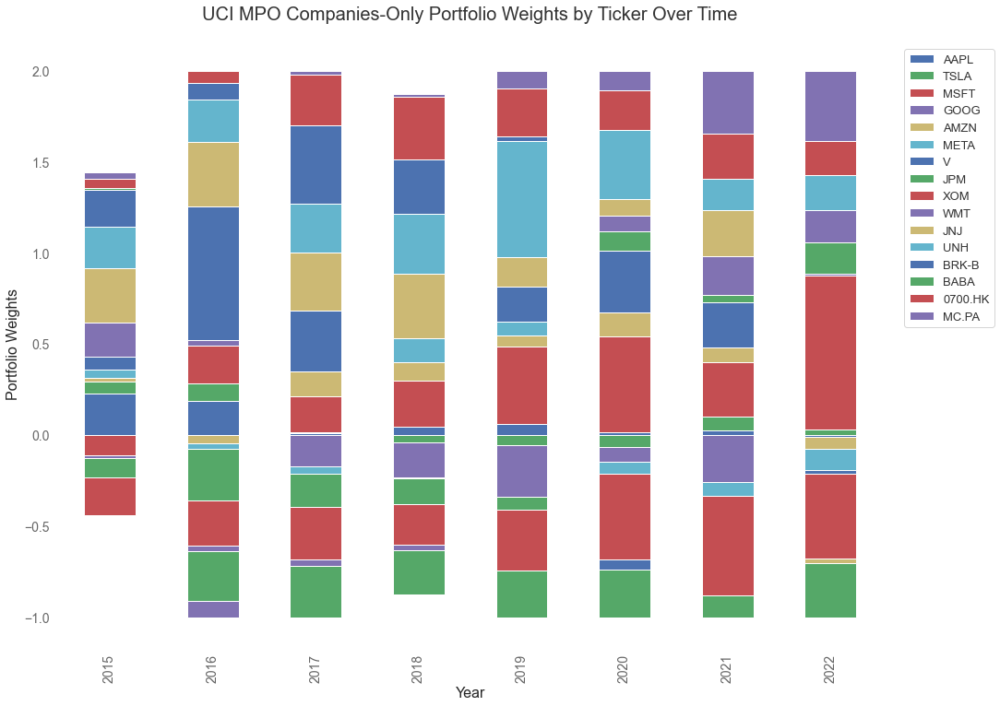

In [203]:
# Plot weights across time: 

# with pandas / plt 
uci_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('UCI MPO Companies-Only Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_uci_mpo_weights = px.bar(uci_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_uci_mpo_weights.update_layout(
    title = 'UCI MPO Companies-Only Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_uci_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_uci_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_uci_mpo_weights.show()

fig_uci_mpo_weights.write_image("UCI_Companies_MPO_Weights.png")

### Riskfolio UCI Optimizations - Performance Analysis:

In [204]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
uci_spo_weights = calculate_w(hist_returns_companies, rm='UCI', companies=True)
uci_spo_returns, uniform_returns = returns_fwd(returns_data_full_period_companies, uci_spo_weights, companies=True)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo_uci = qs.reports.metrics(uci_mpo_returns, benchmark = uci_spo_returns)
report_mpo_uniform_uci = qs.reports.metrics(uci_mpo_returns, benchmark = uniform_returns)
report_spo_uniform_uci = qs.reports.metrics(uci_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo_uci, report_mpo_uniform_uci, report_spo_uniform_uci)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_uci_mpo_daily = px.line(uci_mpo_returns, title='Daily UCI Companies-Only MPO Portfolio Returns - 2015-2022')
fig_uci_mpo_daily.update_layout(showlegend=False)
fig_uci_mpo_daily.show()

fig_uci_spo_daily = px.line(uci_spo_returns, title='Daily UCI Companies-Only SPO Portfolio Returns - 2015-2022')
fig_uci_spo_daily.update_layout(showlegend=False)
fig_uci_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily UCI Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_uci_cumul_returns_mpo = (1 + uci_mpo_returns).cumprod() * 100
fig_cumul_uci_mpo = px.line(daily_uci_cumul_returns_mpo, title="Cumulative Returns of UCI Companies-Only MPO Portfolio Indexed to 100: 2015-2022")
fig_cumul_uci_mpo.update_layout(showlegend=False)
fig_cumul_uci_mpo.show()

daily_uci_cumul_returns_spo = (1 + uci_spo_returns).cumprod() * 100
fig_cum_uci_spo = px.line(daily_uci_cumul_returns_spo, title="Cumulative Returns of UCI Companies-Only SPO Portfolio Indexed to 100: 2015-2022")
fig_cum_uci_spo.update_layout(showlegend=False)
fig_cum_uci_spo.show()
fig_cum_uci_spo.write_image("UCI_companies_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
uniform_uci_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
uniform_uci_cum.update_layout(showlegend=False)
uniform_uci_cum.show()

(252, 16) (16, 1)
Portfolio Stats for 2015:
 Portfolio Annual Return: -0.63%
 PF Annualized Vol: 62.20%
Portfolio Calculated Sharpe Ratio: -0.042


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   119.42%     202.15%
CAGR﹪              10.34%      14.84%

Sharpe              0.51        0.84
Prob. Sharpe Ratio  92.57%      99.03%
Sortino             0.74        1.2
Sortino/√2          0.53        0.85
Omega               1.1         1.1

Max Drawdown        -46.43%     -25.97%
Longest DD Days     784         364

Gain/Pain Ratio     0.1         0.16
Gain/Pain (1M)      0.59        0.93

Payoff Ratio        0.97        0.95
Profit Factor       1.1         1.16
Common Sense Ratio  1.0         1.18
CPC Index           0.55        0.6
Tail Ratio          0.91        1.01
Ou

None

None

None

# Riskfolio CDaR (Conditional Drawdown at Risk) Optimization Runs, COMPANIES-ONLY, 2015-2022:

In [205]:

rm = 'CDaR'
full_holding_period = list(price_returns_dict_companies.keys())[-1] # 1/1/2015-1/1/2023

#initial optimization 1/1/2015
cdar_mpo_weights_df = calculate_w(hist_returns_companies, rm='CDaR', companies=True)
cdar_mpo_returns, _ = returns_fwd(price_returns_dict_companies['2015']['returns'], cdar_mpo_weights_df, companies=True)

# 2016-2022 optimizatiosn & daily portfolio return calcs
for i, year in enumerate(range(2016, 2023)):
    daily_returns_last_5yr = price_returns_dict_companies[multiyr_periods_list_companies[i]]['returns']    
    cdar_mpo_weights_new = calculate_w(daily_returns_last_5yr, opt_year=f'{year}', rm='CDaR', companies=True)
    cdar_mpo_weights_df = pd.concat([cdar_mpo_weights_df, cdar_mpo_weights_new], axis=1)
    cdar_pf_returns, _ = returns_fwd(price_returns_dict_companies[f'{year}']['returns'], cdar_mpo_weights_new, companies=True)
    cdar_mpo_returns = pd.concat([cdar_mpo_returns, cdar_pf_returns])

cols = list(price_returns_dict_companies.keys())[:8]
cdar_mpo_weights_df.columns = cols
cdar_mpo_returns.columns = ['Daily PF Returns']

with pd.option_context('display.float_format', '{:,.4%}'.format):
    print(f'Portfolio Weights by Year Using {rm} as Risk Measure:')
    display(cdar_mpo_weights_df)
    print(f'Portfolio Daily Returns Using {rm} as Risk Measure:')
    display(cdar_mpo_returns)

daily_cumul_returns_fwd_cdar = (1 + cdar_mpo_returns).cumprod() * 100 # compounding, indexed at 100 
fig_cdar_mpo_cum = px.line(daily_cumul_returns_fwd_cdar, title="Cumulative Returns of CDaR Companies-Only MPO Optimized Portfolio Indexed to 100")
fig_cdar_mpo_cum.update_layout(showlegend=False)
fig_cdar_mpo_cum.show()
fig_cdar_mpo_cum.write_image("CDaR_Companies_MPO_cumulative_returns.png")



(252, 16) (16, 1)
Portfolio Stats for 2015:
 Portfolio Annual Return: -6.50%
 PF Annualized Vol: 84.36%
Portfolio Calculated Sharpe Ratio: -0.101


(252, 16) (16, 1)
Portfolio Stats for 2016:
 Portfolio Annual Return: 0.78%
 PF Annualized Vol: 74.64%
Portfolio Calculated Sharpe Ratio: -0.016


(251, 16) (16, 1)
Portfolio Stats for 2017:
 Portfolio Annual Return: 45.86%
 PF Annualized Vol: 193.90%
Portfolio Calculated Sharpe Ratio: 0.226


(251, 16) (16, 1)
Portfolio Stats for 2018:
 Portfolio Annual Return: 9.56%
 PF Annualized Vol: 78.89%
Portfolio Calculated Sharpe Ratio: 0.096


(252, 16) (16, 1)
Portfolio Stats for 2019:
 Portfolio Annual Return: 36.88%
 PF Annualized Vol: 162.86%
Portfolio Calculated Sharpe Ratio: 0.214


(253, 16) (16, 1)
Portfolio Stats for 2020:
 Portfolio Annual Return: 38.02%
 PF Annualized Vol: 181.90%
Portfolio Calculated Sharpe Ratio: 0.198


(252, 16) (16, 1)
Portfolio Stats for 2021:
 Portfolio Annual Return: 9.26%
 PF Annualized Vol: 92.55%
Portfolio Ca

,2015,2016,2017,2018,2019,2020,2021,2022
AAPL,25.9679%,23.2967%,5.1833%,11.6851%,2.5991%,0.0000%,0.0000%,0.0000%
TSLA,7.0063%,8.5901%,2.3463%,-4.3017%,-7.4165%,-12.5689%,7.7437%,-1.3677%
MSFT,-15.1951%,24.6625%,18.1049%,26.6778%,42.1412%,42.7635%,31.7739%,60.0795%
GOOG,-4.6366%,0.0000%,-16.5572%,-15.6931%,-7.4980%,1.8642%,-23.7487%,12.6130%
AMZN,-0.3413%,-5.4565%,5.9245%,3.2760%,-0.0000%,4.9558%,12.4247%,0.0000%
META,5.1931%,1.7688%,-1.9577%,15.8405%,6.3267%,-0.1492%,-5.8592%,-27.2377%
V,7.6759%,65.9434%,21.3783%,0.0000%,14.8872%,33.8478%,7.4162%,-0.0000%
JPM,-7.8746%,-32.0880%,-15.8669%,-24.3446%,-14.1920%,7.7899%,5.5719%,12.8903%
XOM,-23.3717%,-29.2567%,-29.8662%,-27.6915%,-42.4296%,-54.5324%,-54.0371%,-41.5048%
WMT,23.1006%,3.0856%,-1.7278%,-1.1238%,0.0000%,15.4100%,22.8899%,25.9789%


Portfolio Daily Returns Using CDaR as Risk Measure:


,Daily PF Returns
Date,
2015-01-05,-1.1351%
2015-01-06,1.1425%
2015-01-07,1.9583%
2015-01-08,2.4691%
2015-01-09,-1.1308%
...,...
2022-12-23,-0.6063%
2022-12-27,-1.2544%
2022-12-28,0.2228%


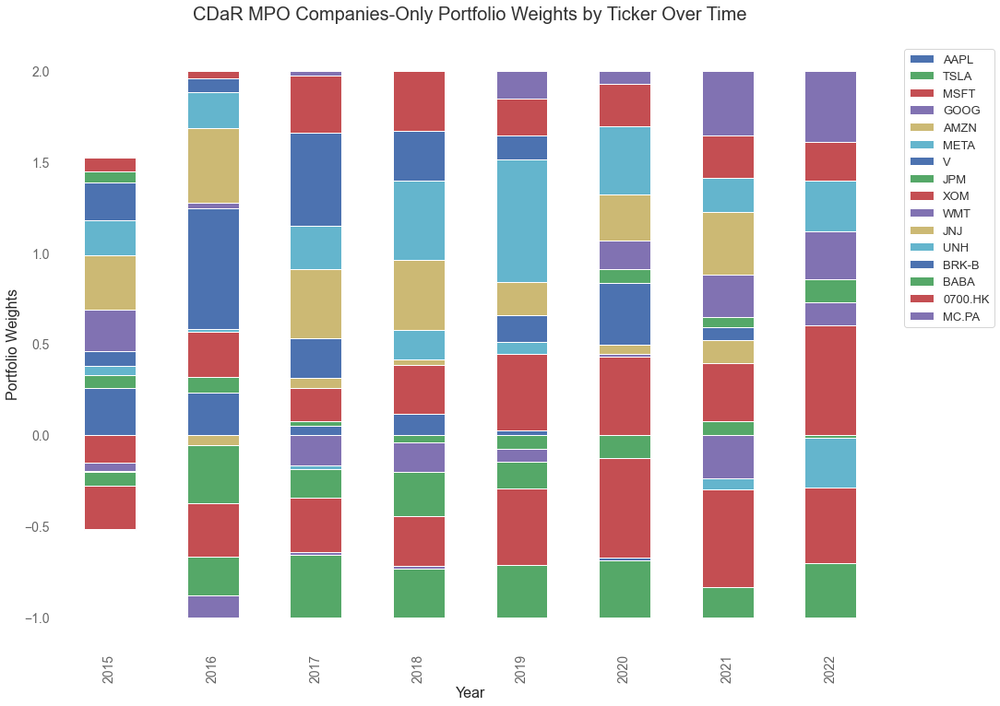

In [206]:
# Plot weights across time: 

# with pandas / plt 
cdar_mpo_weights_df.transpose().plot.bar(stacked=True, figsize=(16,12))
plt.xlabel('Year', fontsize=16, y=1.04)
plt.ylabel('Portfolio Weights', fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('CDaR MPO Companies-Only Portfolio Weights by Ticker Over Time', fontsize=20, y=1.03)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=13)
plt.show()

# with Plotly Express: 
fig_cdar_mpo_weights = px.bar(cdar_mpo_weights_df.transpose(), barmode='stack', color_continuous_scale=px.colors.diverging.BrBG)

fig_cdar_mpo_weights.update_layout(
    title = 'CDaR Companies-Only MPO Portfolio Weights by Ticker by Year',
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Portfolio Weight',
    legend_title='Ticker',
    yaxis=dict(range=[-1, 1.5], dtick=0.25),
    showlegend=True,
    height=1000,
)

fig_cdar_mpo_weights.update_xaxes(showgrid=True, showline=True)
fig_cdar_mpo_weights.update_yaxes(showgrid=True, showline=True)

fig_cdar_mpo_weights.show()

fig_cdar_mpo_weights.write_image("CDaR_Companies_MPO_Weights.png")

### Riskfolio CDaR Optimizations - Performance Analysis:

In [207]:
# daily returns for SPO & equal-weighted portfolios 2015-2022: 
cdar_spo_weights = calculate_w(hist_returns_companies, rm='CDaR', companies=True)
cdar_spo_returns, uniform_returns = returns_fwd(returns_data_full_period_companies, cdar_spo_weights, companies=True)

# Generating Quantstats Portfolio Comparison Reports: 
report_mpo_spo_cdar = qs.reports.metrics(cdar_mpo_returns, benchmark = cdar_spo_returns)
report_mpo_uniform_cdar = qs.reports.metrics(cdar_mpo_returns, benchmark = uniform_returns)
report_spo_uniform_cdar = qs.reports.metrics(cdar_spo_returns, benchmark = uniform_returns)
display(report_mpo_spo_cdar, report_mpo_uniform_cdar, report_spo_uniform_cdar)    

# Generate daily portfolio returns charts for the 3 portfolio approaches    
fig_cdar_mpo_daily = px.line(uci_mpo_returns, title='Daily CDaR Companies-Only MPO Portfolio Returns - 2015-2022')
fig_cdar_mpo_daily.update_layout(showlegend=False)
fig_cdar_mpo_daily.show()

fig_cdar_spo_daily = px.line(uci_spo_returns, title='Daily CDaR Companies-Only SPO Portfolio Returns - 2015-2022')
fig_cdar_spo_daily.update_layout(showlegend=False)
fig_cdar_spo_daily.show()

fig_uniform_daily = px.line(uniform_returns, title='Daily CDaR Uniform Portfolio Returns - 2015-2022')
fig_uniform_daily.update_layout(showlegend=False)
fig_uniform_daily.show()

# Cumulative portfolio return charts for the 3 approaches: 
daily_cdar_cumul_returns_mpo = (1 + cdar_mpo_returns).cumprod() * 100
fig_cumul_cdar_mpo = px.line(daily_cdar_cumul_returns_mpo, title="Cumulative Returns of CDaR Companies-Only MPO Portfolio Indexed to 100: 2015-2022")
fig_cumul_cdar_mpo.update_layout(showlegend=False)
fig_cumul_cdar_mpo.show()

daily_cdar_cumul_returns_spo = (1 + cdar_spo_returns).cumprod() * 100
fig_cum_cdar_spo = px.line(daily_cdar_cumul_returns_spo, title="Cumulative Returns of CDaR Companies-Only SPO Portfolio Indexed to 100: 2015-2022")
fig_cum_cdar_spo.update_layout(showlegend=False)
fig_cum_cdar_spo.show()
fig_cum_cdar_spo.write_image("CDaR_Companies_SPO_cumulative_returns.png")

daily_cumul_returns_uniform = (1 + uniform_returns).cumprod() * 100
uniform_cdar_cum = px.line(daily_cumul_returns_uniform, title="Cumulative Returns of Uniform Portfolio Indexed to 100: 2015-2022")
uniform_cdar_cum.update_layout(showlegend=False)
uniform_cdar_cum.show()

(252, 16) (16, 1)
Portfolio Stats for 2015:
 Portfolio Annual Return: -6.50%
 PF Annualized Vol: 84.36%
Portfolio Calculated Sharpe Ratio: -0.101


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   139.85%     159.52%
CAGR﹪              11.57%      12.68%

Sharpe              0.55        0.73
Prob. Sharpe Ratio  94.19%      97.92%
Sortino             0.82        1.04
Sortino/√2          0.58        0.73
Omega               1.1         1.1

Max Drawdown        -36.53%     -31.26%
Longest DD Days     790         702

Gain/Pain Ratio     0.1         0.14
Gain/Pain (1M)      0.68        0.76

Payoff Ratio        0.96        0.93
Profit Factor       1.1         1.14
Common Sense Ratio  1.01        1.15
CPC Index           0.55        0.58
Tail Ratio          0.91        1.01


None

None

None

# Older Manual Optimization Runs with Riskfolio-Lib: 

## Riskfolio Multi-Period Optimization based on CVaR: 2016-2022

In [257]:
def calc_performance(optimal_weights=optimal_weights, next_year= '2015', next_5yr= '2015 ⟺ 2020'):
    """    
    Calculate portfolio returns for different methods
    """

    daily_returns_next_5yr = price_returns_dict[next_5yr]['returns']
    
    optimal_returns_fwd, uniform_returns_fwd = returns_fwd(daily_returns_next_5yr, optimal_weights)
    report = qs.reports.metrics(optimal_returns_fwd, benchmark = uniform_returns_fwd)
    display(report)
    
    fig = px.line(optimal_returns_fwd, title='Daily Portfolio Returns - Next 5 Years', labels='Optimized Portfolio')
    fig.update_layout(showlegend=False)
    fig.show()
    
    daily_cumul_returns_fwd = 1 + optimal_returns_fwd
    daily_cumul_returns_fwd = daily_cumul_returns_fwd.cumprod() * 100 
    fig2 = px.line(daily_cumul_returns_fwd, title="Cumulative Returns of Optimized Portfolio Starting with $100")
    fig2.update_layout(showlegend=False)
    fig2.show()
    fig2.write_image(f"riskfolio_optimized_cumulative_returns{next_year}.png")
    
    #return optimal_returns_fwd

# print('Performance Evaluation for Initial Optimization with Riskfolio-Lib 1/1/2015: \n')
# print('='*30, '\n\n')
# calc_performance()

Optimization # 2 1/1/2016: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,1.902799e-14
EEM,2.057127e-14
QQQ,1.010602e-13
SPY,9.059141e-14
VNQ,2.626826e-14
BND,7.987481e-01
IGOV,1.974601e-13
GLD,1.707300e-14
XLV,4.212300e-13
XLF,4.388819e-14


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2016-01-05  2016-01-05
End Period          2020-12-31  2020-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   56.54%      138.75%
CAGR﹪              9.39%       19.05%

Sharpe              1.43        1.1
Prob. Sharpe Ratio  99.7%       98.95%
Sortino             1.96        1.48
Sortino/√2          1.38        1.05
Omega               1.37        1.37

Max Drawdown        -12.07%     -31.36%
Longest DD Days     149         519

Gain/Pain Ratio     0.37        0.25
Gain/Pain (1M)      2.93        1.62

Payoff Ratio        0.88        0.82
Profit Factor       1.37        1.25
Common Sense Ratio  1.43        1.19
CPC Index           0.71        0.59
Tail Ratio          1.04        0.95
Outlier Win Ratio   7.35        2.57
Outlier Loss Ratio  8.65        2.88

MTD                 1.46%       5.53%
3M                  3.71%       16.

None

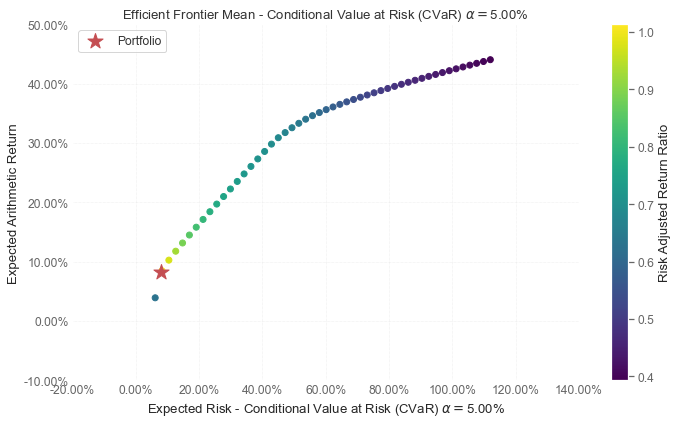

In [31]:
# 2016 optimization 
i=0
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2016, _ = calculate_w(daily_returns_last_5yr, rm='CVaR')
print(f'Optimization # {i+2} 1/1/2016: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2016)
calc_performance(optimal_weights_2016, multiyr_periods_list[i+5])


Optimization # 3 1/1/2017: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,2.207938e-14
EEM,1.474583e-14
QQQ,1.884311e-13
SPY,2.215471e-13
VNQ,1.277195e-13
BND,7.386351e-01
IGOV,3.504431e-13
GLD,1.494808e-14
XLV,2.865506e-13
XLF,1.214489e-11


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2017-01-04  2017-01-04
End Period          2021-12-31  2021-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   61.03%      144.24%
CAGR﹪              10.01%      19.59%

Sharpe              1.4         1.12
Prob. Sharpe Ratio  99.61%      99.07%
Sortino             1.88        1.51
Sortino/√2          1.33        1.07
Omega               1.38        1.38

Max Drawdown        -13.59%     -31.36%
Longest DD Days     186         519

Gain/Pain Ratio     0.38        0.25
Gain/Pain (1M)      2.59        1.53

Payoff Ratio        0.84        0.81
Profit Factor       1.38        1.25
Common Sense Ratio  1.42        1.13
CPC Index           0.7         0.59
Tail Ratio          1.03        0.91
Outlier Win Ratio   7.36        2.63
Outlier Loss Ratio  8.16        2.85

MTD                 0.94%       1.56%
3M                  2.44%       5.

None

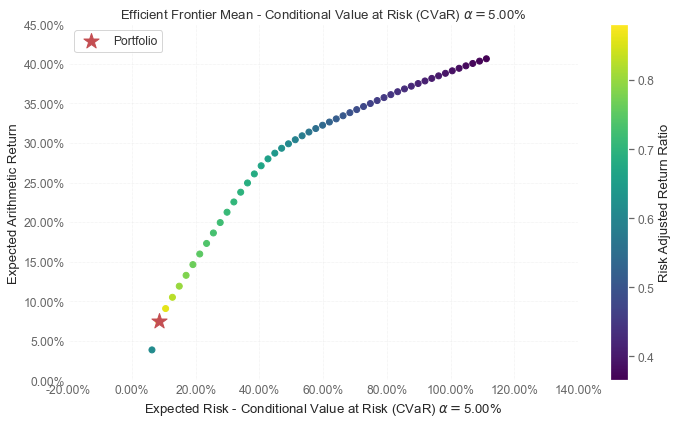

In [32]:
# 2017 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2017, _ = calculate_w(daily_returns_last_5yr, rm='CVaR')
print(f'Optimization # {i+2} 1/1/2017: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2017)
calc_performance(optimal_weights_2017, multiyr_periods_list[i+5])


Optimization # 4 1/1/2018: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,1.636558e-14
EEM,1.370008e-14
QQQ,4.206049e-13
SPY,5.115046e-13
VNQ,1.897998e-13
BND,6.774245e-01
IGOV,3.134943e-12
GLD,2.275566e-13
XLV,4.493477e-13
XLF,1.606323e-12


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2018-01-03  2018-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   19.37%      29.46%
CAGR﹪              3.61%       5.31%

Sharpe              0.42        0.36
Prob. Sharpe Ratio  81.76%      78.68%
Sortino             0.55        0.48
Sortino/√2          0.39        0.34
Omega               1.09        1.09

Max Drawdown        -21.61%     -31.36%
Longest DD Days     490         519

Gain/Pain Ratio     0.09        0.07
Gain/Pain (1M)      0.39        0.34

Payoff Ratio        0.79        0.82
Profit Factor       1.09        1.07
Common Sense Ratio  1.01        0.92
CPC Index           0.49        0.48
Tail Ratio          0.93        0.86
Outlier Win Ratio   6.06        2.67
Outlier Loss Ratio  6.0         2.78

MTD                 -2.46%      -5.75%
3M                  -0.82%      -0.

None

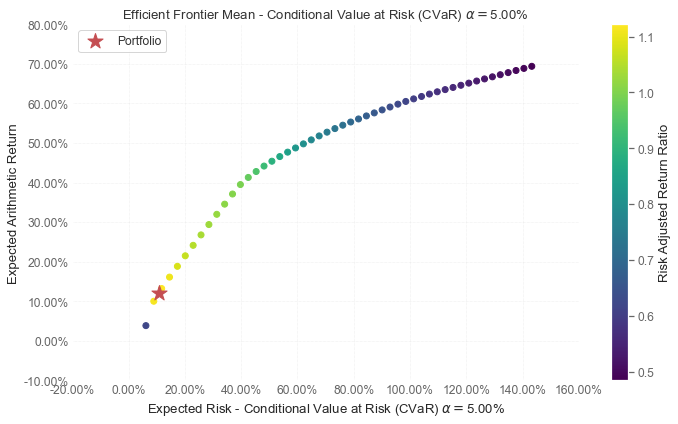

In [33]:
# 2018 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2018, _ = calculate_w(daily_returns_last_5yr, rm='CVaR')
print(f'Optimization # {i+2} 1/1/2018: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2018)
calc_performance(optimal_weights_2018, multiyr_periods_list[i+5])

Optimization # 5 1/1/2019: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,1.507954e-14
EEM,3.681127e-15
QQQ,5.761247e-14
SPY,5.006644e-14
VNQ,5.043666e-14
BND,8.133243e-01
IGOV,2.691418e-13
GLD,5.447123e-13
XLV,6.438244e-14
XLF,8.022471e-14


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2019-01-03  2019-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   12.78%      44.68%
CAGR﹪              3.06%       9.7%

Sharpe              0.42        0.55
Prob. Sharpe Ratio  79.29%      85.97%
Sortino             0.56        0.74
Sortino/√2          0.4         0.52
Omega               1.1         1.1

Max Drawdown        -17.41%     -31.36%
Longest DD Days     415         416

Gain/Pain Ratio     0.1         0.11
Gain/Pain (1M)      0.42        0.55

Payoff Ratio        0.75        0.81
Profit Factor       1.1         1.11
Common Sense Ratio  1.04        0.98
CPC Index           0.46        0.5
Tail Ratio          0.95        0.89
Outlier Win Ratio   7.7         2.51
Outlier Loss Ratio  7.93        2.7

MTD                 -1.5%       -5.75%
3M                  1.48%       -0.19%


None

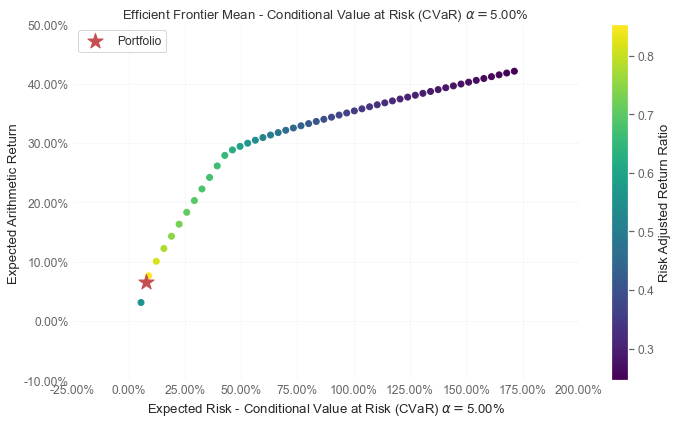

In [34]:
# 2019 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2019, _ = calculate_w(daily_returns_last_5yr, rm='CVaR')
print(f'Optimization # {i+2} 1/1/2019: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2019)
calc_performance(optimal_weights_2019, multiyr_periods_list[i+5])

Optimization # 6 1/1/2020: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,1.386976e-15
EEM,4.704756e-16
QQQ,3.654766e-15
SPY,4.020700e-15
VNQ,2.522558e-15
BND,8.021186e-01
IGOV,2.562827e-14
GLD,2.386552e-02
XLV,3.487612e-15
XLF,5.399517e-15


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2020-01-03  2020-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -3.98%      10.68%
CAGR﹪              -1.35%      3.45%

Sharpe              -0.11       0.26
Prob. Sharpe Ratio  42.3%       67.42%
Sortino             -0.15       0.35
Sortino/√2          -0.1        0.25
Omega               0.98        0.98

Max Drawdown        -19.42%     -31.36%
Longest DD Days     415         416

Gain/Pain Ratio     -0.02       0.05
Gain/Pain (1M)      -0.09       0.24

Payoff Ratio        0.72        0.82
Profit Factor       0.98        1.05
Common Sense Ratio  0.93        0.87
CPC Index           0.39        0.47
Tail Ratio          0.95        0.83
Outlier Win Ratio   9.07        2.81
Outlier Loss Ratio  7.32        2.55

MTD                 -1.6%       -5.75%
3M                  1.61%       -0.

None

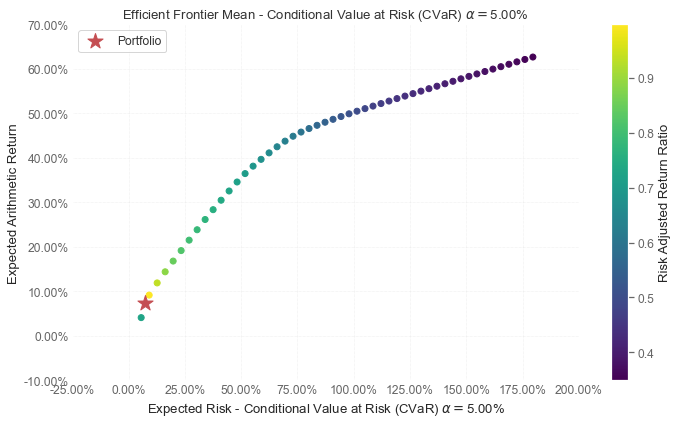

In [35]:
# 2020 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2020, _ = calculate_w(daily_returns_last_5yr, rm='CVaR')
print(f'Optimization # {i+2} 1/1/2020: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2020)
calc_performance(optimal_weights_2020, multiyr_periods_list[i+5])

Optimization # 7 1/1/2021: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,7.747167e-15
EEM,3.109680e-14
QQQ,1.798514e-13
SPY,1.098812e-13
VNQ,1.472303e-14
BND,7.525505e-01
IGOV,4.276099e-12
GLD,4.306692e-02
XLV,1.958672e-13
XLF,1.065291e-13


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2021-01-05  2021-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -16.54%     -11.08%
CAGR﹪              -8.71%      -5.75%

Sharpe              -1.08       -0.22
Prob. Sharpe Ratio  6.35%       37.65%
Sortino             -1.42       -0.3
Sortino/√2          -1.0        -0.22
Omega               0.83        0.83

Max Drawdown        -21.06%     -29.61%
Longest DD Days     415         416

Gain/Pain Ratio     -0.17       -0.04
Gain/Pain (1M)      -0.52       -0.16

Payoff Ratio        0.74        0.89
Profit Factor       0.83        0.96
Common Sense Ratio  0.65        0.87
CPC Index           0.32        0.44
Tail Ratio          0.78        0.91
Outlier Win Ratio   5.92        2.33
Outlier Loss Ratio  4.97        2.34

MTD                 -2.93%      -5.75%
3M                  -1.74%   

None

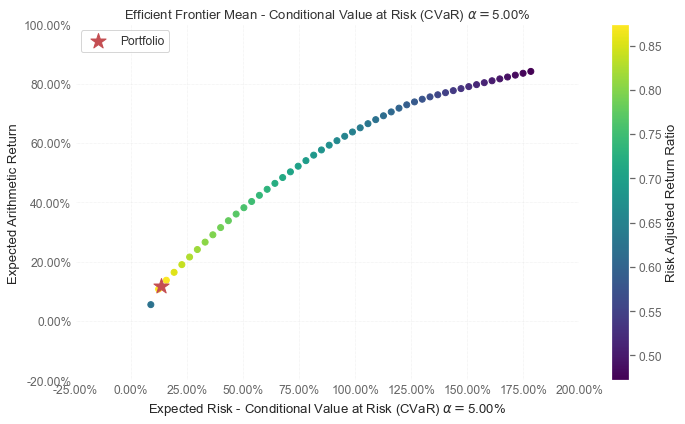

In [36]:
# 2021 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2021, _ = calculate_w(daily_returns_last_5yr, rm='CVaR')
print(f'Optimization # {i+2} 1/1/2021: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2021)
calc_performance(optimal_weights_2021, multiyr_periods_list[i+5])

Optimization # 8 1/1/2022: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,4.406340e-14
EEM,4.073859e-15
QQQ,4.462782e-13
SPY,3.352171e-13
VNQ,1.710561e-13
BND,6.812173e-01
IGOV,4.345499e-12
GLD,7.555125e-02
XLV,1.154620e-12
XLF,2.113263e-13


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2022-01-04  2022-01-04
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -18.69%     -25.53%
CAGR﹪              -18.93%     -25.83%

Sharpe              -1.85       -1.17
Prob. Sharpe Ratio  3.44%       12.33%
Sortino             -2.43       -1.57
Sortino/√2          -1.72       -1.11
Omega               0.74        0.74

Max Drawdown        -19.65%     -27.61%
Longest DD Days     359         351

Gain/Pain Ratio     -0.26       -0.17
Gain/Pain (1M)      -0.72       -0.62

Payoff Ratio        0.93        1.05
Profit Factor       0.74        0.83
Common Sense Ratio  0.62        0.75
CPC Index           0.31        0.39
Tail Ratio          0.84        0.91
Outlier Win Ratio   4.51        2.04
Outlier Loss Ratio  4.81        2.42

MTD                 -3.32%      -5.75%
3M                  -1.79% 

None

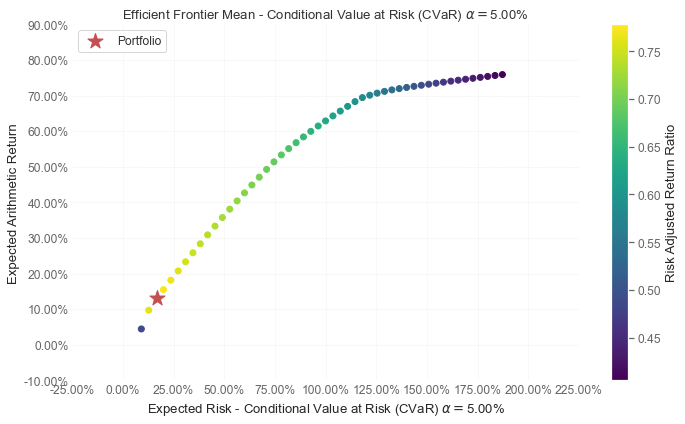

In [37]:
# 2022 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2022, _ = calculate_w(daily_returns_last_5yr, rm='CVaR')
print(f'Optimization # {i+2} 1/1/2022: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2022)
calc_performance(optimal_weights_2022, multiyr_periods_list[i+5])

## Riskfolio Multi-Period Optimization based on MV: Initial 2015

,weights
GSG,8.471924e-09
EEM,6.306753e-09
QQQ,3.536581e-08
SPY,3.465154e-08
VNQ,1.968200e-08
BND,7.868873e-01
IGOV,2.740066e-08
GLD,1.703957e-08
XLV,1.690734e-02
XLF,1.785987e-08


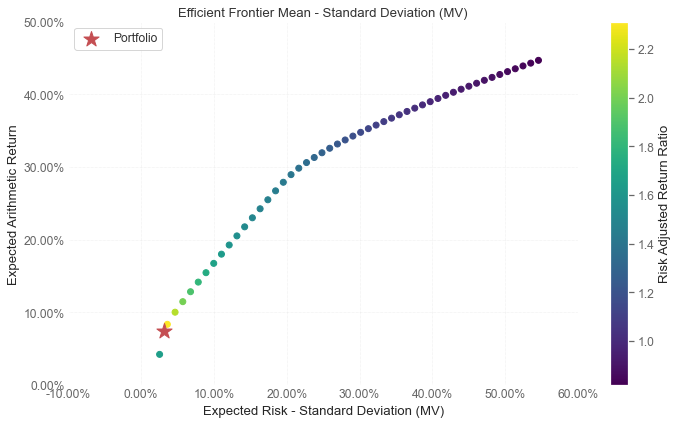

In [48]:
optimal_weights_mv, ax = calculate_w(hist_returns, rm='MV')
optimal_weights_mv

In [51]:
calc_performance(optimal_weights=optimal_weights_mv)

                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2019-12-31  2019-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   31.68%      90.86%
CAGR﹪              5.67%       13.83%

Sharpe              1.54        1.09
Prob. Sharpe Ratio  99.97%      99.17%
Sortino             2.27        1.54
Sortino/√2          1.61        1.09
Omega               1.29        1.29

Max Drawdown        -3.81%      -19.25%
Longest DD Days     324         519

Gain/Pain Ratio     0.29        0.21
Gain/Pain (1M)      2.05        1.38

Payoff Ratio        0.96        0.9
Profit Factor       1.29        1.21
Common Sense Ratio  1.34        1.14
CPC Index           0.7         0.6
Tail Ratio          1.04        0.95
Outlier Win Ratio   6.95        2.13
Outlier Loss Ratio  8.25        2.41

MTD                 1.2%        4.16%
3M                  4.61%       11.98

None

### Riskfolio Multi-Period Optimization based on MV: 2016-2022

Optimization # 2 1/1/2016: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,2.223092e-09
EEM,2.015563e-09
QQQ,1.196189e-08
SPY,9.580480e-09
VNQ,5.561066e-09
BND,8.001306e-01
IGOV,1.147668e-08
GLD,4.474320e-09
XLV,2.164049e-02
XLF,5.947827e-09


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2016-01-05  2016-01-05
End Period          2020-12-31  2020-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   50.26%      138.75%
CAGR﹪              8.5%        19.05%

Sharpe              1.37        1.1
Prob. Sharpe Ratio  99.55%      98.95%
Sortino             1.87        1.48
Sortino/√2          1.32        1.05
Omega               1.36        1.36

Max Drawdown        -11.34%     -31.36%
Longest DD Days     161         519

Gain/Pain Ratio     0.36        0.25
Gain/Pain (1M)      2.76        1.62

Payoff Ratio        0.86        0.8
Profit Factor       1.36        1.25
Common Sense Ratio  1.35        1.19
CPC Index           0.69        0.57
Tail Ratio          0.99        0.95
Outlier Win Ratio   7.83        2.51
Outlier Loss Ratio  8.95        2.79

MTD                 1.32%       5.53%
3M                  3.36%       16.9

None

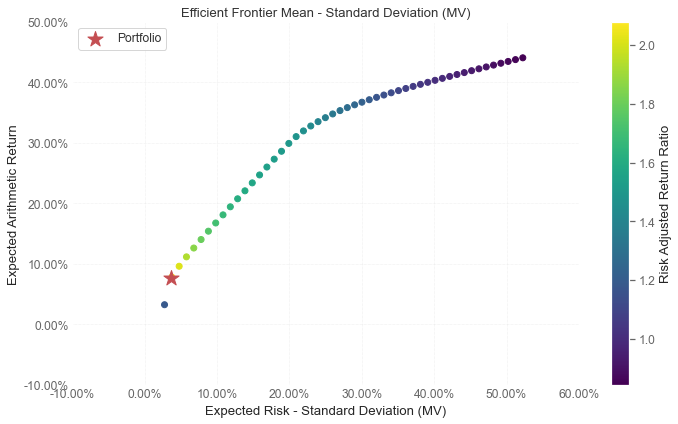

In [52]:
# 2016 optimization 
i=0
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2016, _ = calculate_w(daily_returns_last_5yr, rm='MV')
print(f'Optimization # {i+2} 1/1/2016: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2016)
calc_performance(optimal_weights_2016, multiyr_periods_list[i+5])


Optimization # 3 1/1/2017: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,1.145675e-08
EEM,1.210718e-08
QQQ,6.782131e-08
SPY,6.694606e-08
VNQ,4.178102e-08
BND,7.194940e-01
IGOV,7.303730e-08
GLD,2.349980e-08
XLV,8.012089e-08
XLF,2.773204e-07


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2017-01-04  2017-01-04
End Period          2021-12-31  2021-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   63.03%      144.24%
CAGR﹪              10.29%      19.59%

Sharpe              1.4         1.12
Prob. Sharpe Ratio  99.64%      99.07%
Sortino             1.9         1.51
Sortino/√2          1.34        1.07
Omega               1.38        1.38

Max Drawdown        -13.53%     -31.36%
Longest DD Days     199         519

Gain/Pain Ratio     0.38        0.25
Gain/Pain (1M)      2.51        1.53

Payoff Ratio        0.83        0.82
Profit Factor       1.38        1.25
Common Sense Ratio  1.43        1.13
CPC Index           0.69        0.6
Tail Ratio          1.04        0.91
Outlier Win Ratio   7.28        2.65
Outlier Loss Ratio  7.84        2.86

MTD                 1.0%        1.56%
3M                  2.43%       5.0

None

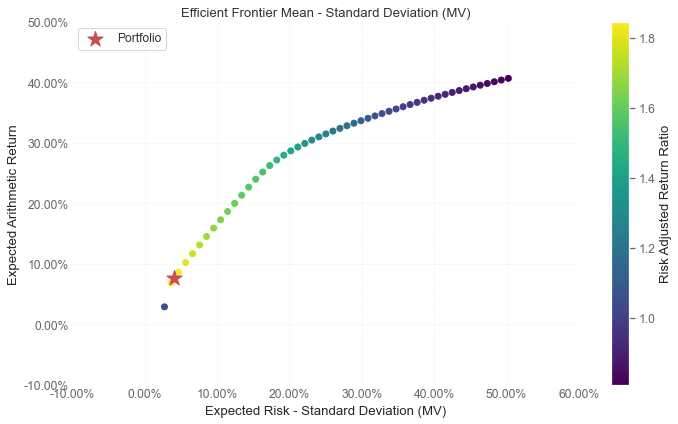

In [53]:
# 2017 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2017, _ = calculate_w(daily_returns_last_5yr, rm='MV')
print(f'Optimization # {i+2} 1/1/2017: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2017)
calc_performance(optimal_weights_2017, multiyr_periods_list[i+5])


Optimization # 4 1/1/2018: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,8.568124e-09
EEM,8.856049e-09
QQQ,3.695556e-08
SPY,3.895496e-08
VNQ,1.753676e-08
BND,6.670103e-01
IGOV,9.225456e-08
GLD,2.026424e-08
XLV,3.233696e-08
XLF,8.049157e-08


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2018-01-03  2018-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   18.59%      29.46%
CAGR﹪              3.47%       5.31%

Sharpe              0.4         0.36
Prob. Sharpe Ratio  80.66%      78.68%
Sortino             0.53        0.48
Sortino/√2          0.37        0.34
Omega               1.08        1.08

Max Drawdown        -22.23%     -31.36%
Longest DD Days     480         519

Gain/Pain Ratio     0.08        0.07
Gain/Pain (1M)      0.37        0.34

Payoff Ratio        0.8         0.84
Profit Factor       1.08        1.07
Common Sense Ratio  1.02        0.92
CPC Index           0.49        0.49
Tail Ratio          0.94        0.86
Outlier Win Ratio   5.96        2.68
Outlier Loss Ratio  5.94        2.8

MTD                 -2.34%      -5.75%
3M                  -0.25%      -0.1

None

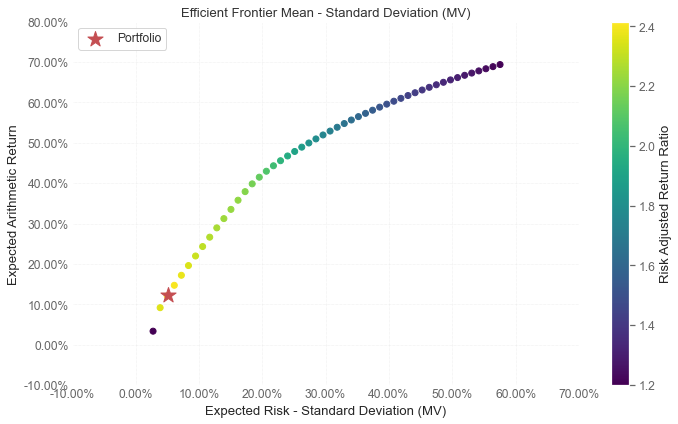

In [54]:
# 2018 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2018, _ = calculate_w(daily_returns_last_5yr, rm='MV')
print(f'Optimization # {i+2} 1/1/2018: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2018)
calc_performance(optimal_weights_2018, multiyr_periods_list[i+5])

Optimization # 5 1/1/2019: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,1.781693e-08
EEM,2.379913e-08
QQQ,6.319345e-08
SPY,5.904958e-08
VNQ,5.276641e-08
BND,7.986141e-01
IGOV,1.263905e-07
GLD,1.647099e-07
XLV,6.558067e-08
XLF,8.337189e-08


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2019-01-03  2019-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   14.26%      44.68%
CAGR﹪              3.4%        9.7%

Sharpe              0.45        0.55
Prob. Sharpe Ratio  80.96%      85.97%
Sortino             0.6         0.74
Sortino/√2          0.43        0.52
Omega               1.1         1.1

Max Drawdown        -17.83%     -31.36%
Longest DD Days     415         416

Gain/Pain Ratio     0.1         0.11
Gain/Pain (1M)      0.45        0.55

Payoff Ratio        0.78        0.81
Profit Factor       1.1         1.11
Common Sense Ratio  1.04        0.98
CPC Index           0.48        0.5
Tail Ratio          0.94        0.89
Outlier Win Ratio   7.41        2.52
Outlier Loss Ratio  7.85        2.73

MTD                 -1.57%      -5.75%
3M                  1.54%       -0.19%

None

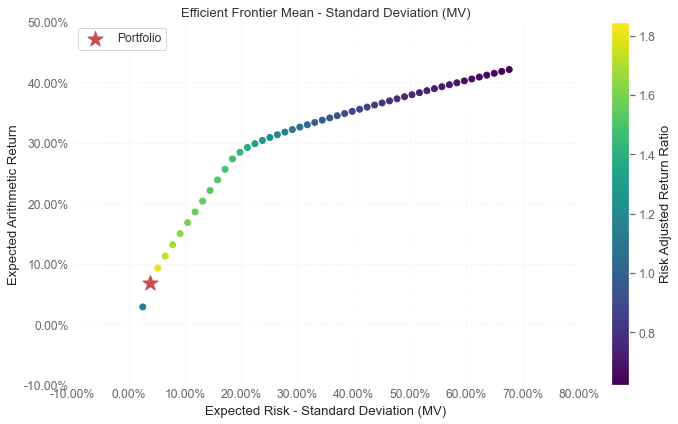

In [55]:
# 2019 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2019, _ = calculate_w(daily_returns_last_5yr, rm='MV')
print(f'Optimization # {i+2} 1/1/2019: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2019)
calc_performance(optimal_weights_2019, multiyr_periods_list[i+5])

Optimization # 6 1/1/2020: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,5.524074e-08
EEM,4.035838e-08
QQQ,9.113324e-08
SPY,9.818258e-08
VNQ,7.185240e-08
BND,7.963724e-01
IGOV,2.636720e-07
GLD,1.233907e-02
XLV,8.170986e-08
XLF,1.095284e-07


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2020-01-03  2020-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -3.52%      10.68%
CAGR﹪              -1.19%      3.45%

Sharpe              -0.09       0.26
Prob. Sharpe Ratio  44.07%      67.42%
Sortino             -0.11       0.35
Sortino/√2          -0.08       0.25
Omega               0.98        0.98

Max Drawdown        -20.11%     -31.36%
Longest DD Days     415         416

Gain/Pain Ratio     -0.02       0.05
Gain/Pain (1M)      -0.07       0.24

Payoff Ratio        0.73        0.83
Profit Factor       0.98        1.05
Common Sense Ratio  0.94        0.87
CPC Index           0.4         0.47
Tail Ratio          0.96        0.83
Outlier Win Ratio   8.63        2.8
Outlier Loss Ratio  7.15        2.59

MTD                 -1.69%      -5.75%
3M                  1.69%       -0.1

None

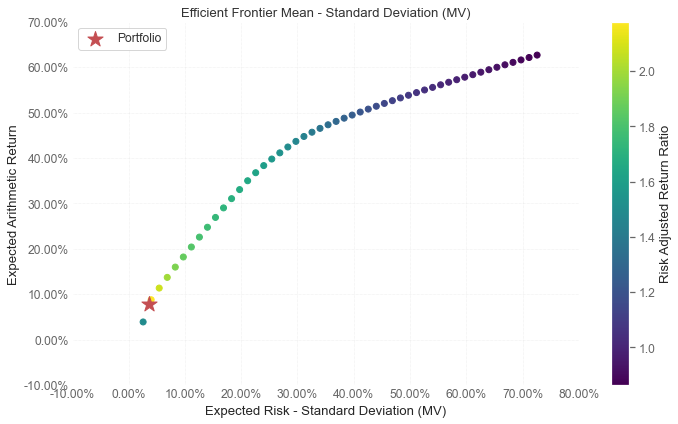

In [56]:
# 2020 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2020, _ = calculate_w(daily_returns_last_5yr, rm='MV')
print(f'Optimization # {i+2} 1/1/2020: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2020)
calc_performance(optimal_weights_2020, multiyr_periods_list[i+5])

Optimization # 7 1/1/2021: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,3.630815e-09
EEM,4.412662e-09
QQQ,7.991439e-09
SPY,6.483959e-09
VNQ,3.254689e-09
BND,4.237068e-01
IGOV,1.615842e-01
GLD,1.107236e-01
XLV,7.373772e-09
XLF,6.142582e-09


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2021-01-05  2021-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -20.87%     -11.08%
CAGR﹪              -11.13%     -5.75%

Sharpe              -1.01       -0.22
Prob. Sharpe Ratio  7.58%       37.65%
Sortino             -1.34       -0.3
Sortino/√2          -0.95       -0.22
Omega               0.84        0.84

Max Drawdown        -25.58%     -29.61%
Longest DD Days     416         416

Gain/Pain Ratio     -0.16       -0.04
Gain/Pain (1M)      -0.51       -0.16

Payoff Ratio        0.81        0.92
Profit Factor       0.84        0.96
Common Sense Ratio  0.79        0.87
CPC Index           0.34        0.45
Tail Ratio          0.94        0.91
Outlier Win Ratio   4.66        2.62
Outlier Loss Ratio  4.34        2.66

MTD                 -4.31%      -5.75%
3M                  -3.03%   

None

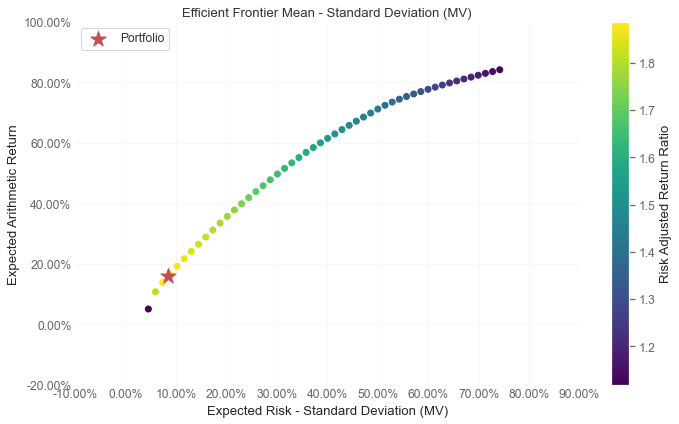

In [57]:
# 2021 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2021, _ = calculate_w(daily_returns_last_5yr, rm='MV')
print(f'Optimization # {i+2} 1/1/2021: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2021)
calc_performance(optimal_weights_2021, multiyr_periods_list[i+5])

Optimization # 8 1/1/2022: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation 



,weights
GSG,4.259632e-08
EEM,2.864303e-08
QQQ,7.401553e-08
SPY,5.885248e-08
VNQ,3.931660e-08
BND,4.739595e-01
IGOV,1.781382e-02
GLD,1.474070e-01
XLV,1.340379e-07
XLF,4.430270e-08


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2022-01-04  2022-01-04
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -22.21%     -25.53%
CAGR﹪              -22.48%     -25.83%

Sharpe              -1.71       -1.17
Prob. Sharpe Ratio  4.52%       12.33%
Sortino             -2.24       -1.57
Sortino/√2          -1.58       -1.11
Omega               0.76        0.76

Max Drawdown        -22.6%      -27.61%
Longest DD Days     359         351

Gain/Pain Ratio     -0.24       -0.17
Gain/Pain (1M)      -0.7        -0.62

Payoff Ratio        0.93        1.03
Profit Factor       0.76        0.83
Common Sense Ratio  0.65        0.75
CPC Index           0.32        0.39
Tail Ratio          0.86        0.91
Outlier Win Ratio   3.81        2.21
Outlier Loss Ratio  4.2         2.71

MTD                 -4.76%      -5.75%
3M                  -3.58% 

None

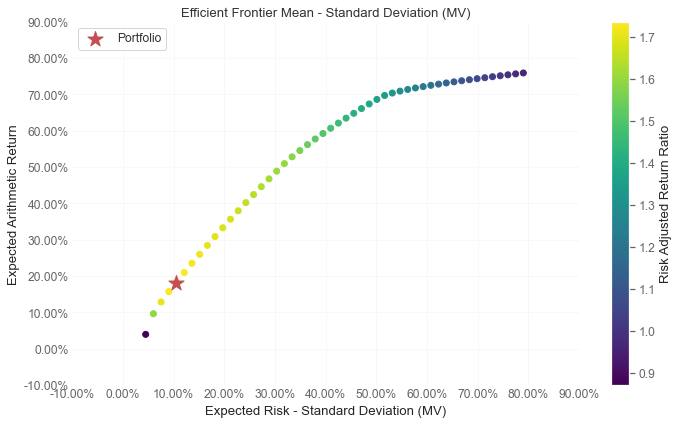

In [58]:
# 2022 optimization 
i+=1
daily_returns_last_5yr = price_returns_dict[multiyr_periods_list[i]]['returns']
optimal_weights_2022, _ = calculate_w(daily_returns_last_5yr, rm='MV')
print(f'Optimization # {i+2} 1/1/2022: Optimized Portfolio Weights, Efficient Frontier and Performance Evaluation \n')
display(optimal_weights_2022)
calc_performance(optimal_weights_2022, multiyr_periods_list[i+5])

# PyPortfolioOpt Weights Optimizations:

In [ ]:
def optimize_pypfopt(stock_data=hist_prices, objective="max_sharpe", next_5yr= '2015 ⟺ 2020'): #, pf_capital_start=100000):
    """
    Available options for pypfopt optimization objectives:
    - ``min_volatility()`` optimizes for minimum volatility
    - ``max_sharpe()`` optimizes for maximal Sharpe ratio (a.k.a the tangency portfolio)
    - ``max_quadratic_utility()`` maximises the quadratic utility, given some risk aversion.
    - ``efficient_risk()`` maximises return for a given target risk
    - ``efficient_return()`` minimises risk for a given target return
    """
    
    # Calculate expected returns and sample covariance
    mu = expected_returns.mean_historical_return(stock_data)
    S = risk_models.sample_cov(stock_data)

    # Instantiate optimizer class & define portfolio constraints:
    # weight bounds apply 2 constraints - allowing short positions and maximium short & long position sizes
    ef = EfficientFrontier(mu, S, weight_bounds=(-0.3, 0.5)) 
    
    
    ef.add_constraint(lambda x: cp.sum(x) <= 1.5) # setting net exposure limits upper end (150% net long)
    ef.add_constraint(lambda x: cp.sum(x) >= -0.5) # setting net exposure limits lower end (50% net short)
    ef.add_constraint(lambda x: cp.sum(cp.abs(x)) <= 2) # setting gross exposure / leverage limits 
    ef.add_objective(ppo.L2_reg, gamma=1) # adds a penalty for negligible weights to minimize zero weights
    
    # Optimize for given objective 
    if objective == "max_sharpe":
        weights = ef.max_sharpe()    
    elif objective == "max_quadratic_utility":
        weights = ef.max_quadratic_utility()
    elif objective == "efficient_risk":
        weights = ef.efficient_risk()
        ef.add_constraint()
        
    # rounded_weights = ef.clean_weights()

    cols = ['symbol', 'optimized']
    weights_df = pd.DataFrame(weights.items(), columns=cols)
    weights_df.set_index('symbol', inplace=True)
    display(weights_df)
    
    ef.portfolio_performance(verbose=True)
    
    # daily asset returns in forward 5 years: 
    daily_returns_next_5yr = price_returns_dict[next_5yr]['returns']
    daily_returns_ntm = price_returns_dict[]
    
    optimal_returns_fwd, uniform_returns_fwd = returns_fwd(daily_returns_next_5yr, optimal_weights=weights_df)
    report = qs.reports.metrics(optimal_returns_fwd, benchmark = uniform_returns_fwd)
    display(report)

    #return report #optimized, uniform, report

## PyPortfolioOpt max_sharpe Optimization Runs: 

In [ ]:
# initial optimization on 1/1/2015: 

optimize_pypfopt()

,optimized
symbol,
GSG,-0.080481
EEM,-0.043030
QQQ,0.060784
SPY,0.042929
VNQ,0.057989
BND,0.015026
IGOV,-0.008125
GLD,-0.011341
XLV,0.067888


Expected annual return: 68.6%
Annual volatility: 32.6%
Sharpe Ratio: 2.04
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2019-12-31  2019-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -6.39%      90.86%
CAGR﹪              -1.32%      13.83%

Sharpe              0.12        1.09
Prob. Sharpe Ratio  60.66%      99.17%
Sortino             0.17        1.54
Sortino/√2          0.12        1.09
Omega               1.02        1.02

Max Drawdown        -56.53%     -19.25%
Longest DD Days     1595        519

Gain/Pain Ratio     0.02        0.21
Gain/Pain (1M)      0.11        1.38

Payoff Ratio        0.84        0.96
Profit Factor       1.02        1.21
Common Sense Ratio  0.91        1.14
CPC Index           0.45        0.64
Tail Ratio          0.9         0.95
Outlier Win Ratio   2.48        6.3
Outlier Loss Ratio  2.45        6.55



None

### PyPortfolioOpt max_sharpe Multi-Period Optimizations: 2016-2022

In [ ]:
for i, year in enumerate(range(2016, 2023)):
    stock_data = price_returns_dict[multiyr_periods_list[i]]['prices']
    # performance_optimal, performance_equal = optimize_pypfopt(tickers, f"{year}-01-01", f"{year+1}-01-01")
    optimize_pypfopt(stock_data=stock_data, next_5yr=multiyr_periods_list[i+5])

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.733857
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 11.6%
Annual volatility: 5.2%
Sharpe Ratio: 1.87
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2016-01-05  2016-01-05
End Period          2020-12-31  2020-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   65.8%       138.75%
CAGR﹪              10.66%      19.05%

Sharpe              1.36        1.1
Prob. Sharpe Ratio  99.69%      98.95%
Sortino             1.89        1.48
Sortino/√2          1.33        1.05
Omega               1.34        1.34

Max Drawdown        -14.68%     -31.36%
Longest DD Days     156         519

Gain/Pain Ratio     0.34        0.25
Gain/Pain (1M)      2.72        1.62

Payoff Ratio        0.89        0.83
Profit Factor       1.34        1.25
Common Sense Ratio  1.38        1.19
CPC Index           0.69        0.6
Tail Ratio          1.02        0.95
Outlier Win Ratio   6.55        2.77
Outlier Loss Ratio  7.45        3.01

M

None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.488562
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 15.6%
Annual volatility: 7.7%
Sharpe Ratio: 1.76
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2017-01-04  2017-01-04
End Period          2021-12-31  2021-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   123.84%     144.24%
CAGR﹪              17.52%      19.59%

Sharpe              1.44        1.12
Prob. Sharpe Ratio  99.83%      99.07%
Sortino             1.98        1.51
Sortino/√2          1.4         1.07
Omega               1.34        1.34

Max Drawdown        -20.86%     -31.36%
Longest DD Days     249         519

Gain/Pain Ratio     0.34        0.25
Gain/Pain (1M)      2.29        1.53

Payoff Ratio        0.89        0.84
Profit Factor       1.34        1.25
Common Sense Ratio  1.42        1.13
CPC Index           0.7         0.61
Tail Ratio          1.06        0.91
Outlier Win Ratio   4.84        3.25
Outlier Loss Ratio  5.49        3.48


None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.374888
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 43.6%
Annual volatility: 12.6%
Sharpe Ratio: 3.30
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2018-01-03  2018-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   31.04%      29.46%
CAGR﹪              5.57%       5.31%

Sharpe              0.39        0.36
Prob. Sharpe Ratio  80.04%      78.68%
Sortino             0.51        0.48
Sortino/√2          0.36        0.34
Omega               1.07        1.07

Max Drawdown        -34.65%     -31.36%
Longest DD Days     532         519

Gain/Pain Ratio     0.07        0.07
Gain/Pain (1M)      0.33        0.34

Payoff Ratio        0.85        0.85
Profit Factor       1.07        1.07
Common Sense Ratio  1.0         0.92
CPC Index           0.5         0.5
Tail Ratio          0.93        0.86
Outlier Win Ratio   3.67        3.49
Outlier Loss Ratio  3.94        3.65

M

None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.603945
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 14.5%
Annual volatility: 7.4%
Sharpe Ratio: 1.70
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2019-01-03  2019-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   34.05%      44.68%
CAGR﹪              7.62%       9.7%

Sharpe              0.66        0.55
Prob. Sharpe Ratio  89.79%      85.97%
Sortino             0.89        0.74
Sortino/√2          0.63        0.52
Omega               1.14        1.14

Max Drawdown        -19.02%     -31.36%
Longest DD Days     415         416

Gain/Pain Ratio     0.14        0.11
Gain/Pain (1M)      0.74        0.55

Payoff Ratio        0.85        0.84
Profit Factor       1.14        1.11
Common Sense Ratio  1.12        0.98
CPC Index           0.54        0.52
Tail Ratio          0.99        0.89
Outlier Win Ratio   5.33        3.05
Outlier Loss Ratio  5.42        3.05

MT

None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.644653
IGOV,0.000000
GLD,0.042893
XLV,0.000000


Expected annual return: 14.3%
Annual volatility: 5.9%
Sharpe Ratio: 2.08
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2020-01-03  2020-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   1.69%       10.68%
CAGR﹪              0.56%       3.45%

Sharpe              0.11        0.26
Prob. Sharpe Ratio  57.28%      67.42%
Sortino             0.14        0.35
Sortino/√2          0.1         0.25
Omega               1.02        1.02

Max Drawdown        -23.88%     -31.36%
Longest DD Days     415         416

Gain/Pain Ratio     0.02        0.05
Gain/Pain (1M)      0.09        0.24

Payoff Ratio        0.79        0.85
Profit Factor       1.02        1.05
Common Sense Ratio  0.92        0.87
CPC Index           0.45        0.48
Tail Ratio          0.9         0.83
Outlier Win Ratio   6.31        2.91
Outlier Loss Ratio  5.82        2.89

M

None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.108201
IGOV,0.122217
GLD,0.194468
XLV,0.000000


Expected annual return: 41.1%
Annual volatility: 16.9%
Sharpe Ratio: 2.31
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2021-01-05  2021-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -29.03%     -11.08%
CAGR﹪              -15.88%     -5.75%

Sharpe              -0.74       -0.22
Prob. Sharpe Ratio  14.71%      37.65%
Sortino             -0.97       -0.3
Sortino/√2          -0.68       -0.22
Omega               0.88        0.88

Max Drawdown        -40.13%     -29.61%
Longest DD Days     416         416

Gain/Pain Ratio     -0.12       -0.04
Gain/Pain (1M)      -0.41       -0.16

Payoff Ratio        0.83        0.89
Profit Factor       0.88        0.96
Common Sense Ratio  0.74        0.87
CPC Index           0.37        0.44
Tail Ratio          0.84        0.91
Outlier Win Ratio   3.05        3.27
Outlier Loss Ratio  3.25        

None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.000000
IGOV,0.000000
GLD,0.233852
XLV,0.000000


Expected annual return: 53.1%
Annual volatility: 23.8%
Sharpe Ratio: 2.14
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2022-01-04  2022-01-04
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -40.93%     -25.53%
CAGR﹪              -41.36%     -25.83%

Sharpe              -1.62       -1.17
Prob. Sharpe Ratio  5.09%       12.33%
Sortino             -2.06       -1.57
Sortino/√2          -1.46       -1.11
Omega               0.77        0.77

Max Drawdown        -41.86%     -27.61%
Longest DD Days     269         351

Gain/Pain Ratio     -0.23       -0.17
Gain/Pain (1M)      -0.71       -0.62

Payoff Ratio        0.87        0.97
Profit Factor       0.77        0.83
Common Sense Ratio  0.6         0.75
CPC Index           0.32        0.36
Tail Ratio          0.78        0.91
Outlier Win Ratio   2.6         3.03
Outlier Loss Ratio  2.76      

None

## PyPortfolioOpt max_quadratic_utility Optimization Runs: 

In [ ]:
# initial optimization 1/1/2015: 

optimize_pypfopt(objective="max_quadratic_utility")

,optimized
symbol,
GSG,0.00000
EEM,0.00000
QQQ,0.00000
SPY,0.00000
VNQ,0.00000
BND,0.00000
IGOV,0.00000
GLD,0.00000
XLV,0.00000


Expected annual return: 59.5%
Annual volatility: 47.4%
Sharpe Ratio: 1.21
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2015-01-05  2015-01-05
End Period          2019-12-31  2019-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   36.52%      90.86%
CAGR﹪              6.44%       13.83%

Sharpe              0.35        1.09
Prob. Sharpe Ratio  78.52%      99.17%
Sortino             0.5         1.54
Sortino/√2          0.35        1.09
Omega               1.06        1.06

Max Drawdown        -54.91%     -19.25%
Longest DD Days     833         519

Gain/Pain Ratio     0.06        0.21
Gain/Pain (1M)      0.32        1.38

Payoff Ratio        0.98        0.94
Profit Factor       1.06        1.21
Common Sense Ratio  0.98        1.14
CPC Index           0.53        0.63
Tail Ratio          0.92        0.95
Outlier Win Ratio   2.32        7.03
Outlier Loss Ratio  2.67        7.59


None

### max_quadratic_utility multi-year optimizations 2016-2022

In [ ]:
for i, year in enumerate(range(2016, 2023)):
    stock_data = price_returns_dict[multiyr_periods_list[i]]['prices']
    # performance_optimal, performance_equal = optimize_pypfopt(tickers, f"{year}-01-01", f"{year+1}-01-01")
    optimize_pypfopt(stock_data=stock_data, objective="max_quadratic_utility", next_5yr=multiyr_periods_list[i+5])
    
    # print(f"Performance for year {year}:")
    # print(f"Optimal: {performance_optimal}")
    # print(f"Equal: {performance_equal}")


,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.000000
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 51.9%
Annual volatility: 44.6%
Sharpe Ratio: 1.12
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2016-01-05  2016-01-05
End Period          2020-12-31  2020-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   533.94%     138.75%
CAGR﹪              44.77%      19.05%

Sharpe              1.0         1.1
Prob. Sharpe Ratio  98.63%      98.95%
Sortino             1.45        1.48
Sortino/√2          1.03        1.05
Omega               1.21        1.21

Max Drawdown        -59.42%     -31.36%
Longest DD Days     836         519

Gain/Pain Ratio     0.21        0.25
Gain/Pain (1M)      1.15        1.62

Payoff Ratio        0.97        0.83
Profit Factor       1.21        1.25
Common Sense Ratio  1.45        1.19
CPC Index           0.63        0.59
Tail Ratio          1.2         0.95
Outlier Win Ratio   2.81        9.16
Outlier Loss Ratio  3.02        8.5



None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.000000
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 47.5%
Annual volatility: 42.0%
Sharpe Ratio: 1.08
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2017-01-04  2017-01-04
End Period          2021-12-31  2021-12-31
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   1,285.68%   144.24%
CAGR﹪              69.32%      19.59%

Sharpe              1.28        1.12
Prob. Sharpe Ratio  99.76%      99.07%
Sortino             1.89        1.51
Sortino/√2          1.34        1.07
Omega               1.27        1.27

Max Drawdown        -60.66%     -31.36%
Longest DD Days     756         519

Gain/Pain Ratio     0.27        0.25
Gain/Pain (1M)      1.67        1.53

Payoff Ratio        0.95        0.84
Profit Factor       1.27        1.25
Common Sense Ratio  1.5         1.13
CPC Index           0.66        0.61
Tail Ratio          1.18        0.91
Outlier Win Ratio   2.67        9.2
Outlier Loss Ratio  2.84        8.37


None

,optimized
symbol,
GSG,0.0
EEM,0.0
QQQ,0.0
SPY,0.0
VNQ,0.0
BND,0.0
IGOV,0.0
GLD,0.0
XLV,0.0


Expected annual return: 187.3%
Annual volatility: 71.5%
Sharpe Ratio: 2.59
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2018-01-03  2018-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -73.68%     29.46%
CAGR﹪              -23.47%     5.31%

Sharpe              0.03        0.36
Prob. Sharpe Ratio  52.47%      78.68%
Sortino             0.04        0.48
Sortino/√2          0.03        0.34
Omega               1.01        1.01

Max Drawdown        -86.43%     -31.36%
Longest DD Days     1127        519

Gain/Pain Ratio     0.01        0.07
Gain/Pain (1M)      0.02        0.34

Payoff Ratio        0.85        0.86
Profit Factor       1.01        1.07
Common Sense Ratio  1.07        0.92
CPC Index           0.44        0.51
Tail Ratio          1.06        0.86
Outlier Win Ratio   2.31        8.87
Outlier Loss Ratio  2.78        9.73


None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.000000
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 52.1%
Annual volatility: 49.2%
Sharpe Ratio: 1.02
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2019-01-03  2019-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   69.09%      44.68%
CAGR﹪              14.06%      9.7%

Sharpe              0.52        0.55
Prob. Sharpe Ratio  84.61%      85.97%
Sortino             0.71        0.74
Sortino/√2          0.5         0.52
Omega               1.1         1.1

Max Drawdown        -70.62%     -31.36%
Longest DD Days     623         416

Gain/Pain Ratio     0.1         0.11
Gain/Pain (1M)      0.42        0.55

Payoff Ratio        0.92        0.88
Profit Factor       1.1         1.11
Common Sense Ratio  1.2         0.98
CPC Index           0.52        0.55
Tail Ratio          1.09        0.89
Outlier Win Ratio   2.66        7.13
Outlier Loss Ratio  3.12        7.23

MT

None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.000000
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 81.0%
Annual volatility: 62.7%
Sharpe Ratio: 1.26
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2020-01-03  2020-01-03
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   4.24%       10.68%
CAGR﹪              1.4%        3.45%

Sharpe              0.37        0.26
Prob. Sharpe Ratio  73.46%      67.42%
Sortino             0.49        0.35
Sortino/√2          0.35        0.25
Omega               1.07        1.07

Max Drawdown        -80.13%     -31.36%
Longest DD Days     625         416

Gain/Pain Ratio     0.07        0.05
Gain/Pain (1M)      0.29        0.24

Payoff Ratio        0.93        0.88
Profit Factor       1.07        1.05
Common Sense Ratio  1.17        0.87
CPC Index           0.51        0.5
Tail Ratio          1.09        0.83
Outlier Win Ratio   2.54        7.74
Outlier Loss Ratio  2.93        7.62

M

None

,optimized
symbol,
GSG,0.0
EEM,0.0
QQQ,0.0
SPY,0.0
VNQ,0.0
BND,0.0
IGOV,0.0
GLD,0.0
XLV,0.0


Expected annual return: 132.1%
Annual volatility: 73.8%
Sharpe Ratio: 1.76
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2021-01-05  2021-01-05
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -69.45%     -11.08%
CAGR﹪              -45.0%      -5.75%

Sharpe              -0.46       -0.22
Prob. Sharpe Ratio  25.83%      37.65%
Sortino             -0.61       -0.3
Sortino/√2          -0.43       -0.22
Omega               0.92        0.92

Max Drawdown        -83.7%      -29.61%
Longest DD Days     625         416

Gain/Pain Ratio     -0.08       -0.04
Gain/Pain (1M)      -0.28       -0.16

Payoff Ratio        0.91        0.9
Profit Factor       0.92        0.96
Common Sense Ratio  0.91        0.87
CPC Index           0.41        0.45
Tail Ratio          0.99        0.91
Outlier Win Ratio   2.03        7.76
Outlier Loss Ratio  2.63        

None

,optimized
symbol,
GSG,0.000000
EEM,0.000000
QQQ,0.000000
SPY,0.000000
VNQ,0.000000
BND,0.000000
IGOV,0.000000
GLD,0.000000
XLV,0.000000


Expected annual return: 104.8%
Annual volatility: 56.2%
Sharpe Ratio: 1.83
                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2022-01-04  2022-01-04
End Period          2022-12-30  2022-12-30
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   -71.5%      -25.53%
CAGR﹪              -72.0%      -25.83%

Sharpe              -1.9        -1.17
Prob. Sharpe Ratio  2.33%       12.33%
Sortino             -2.31       -1.57
Sortino/√2          -1.63       -1.11
Omega               0.72        0.72

Max Drawdown        -71.97%     -27.61%
Longest DD Days     359         351

Gain/Pain Ratio     -0.28       -0.17
Gain/Pain (1M)      -0.74       -0.62

Payoff Ratio        0.82        0.99
Profit Factor       0.72        0.83
Common Sense Ratio  0.52        0.75
CPC Index           0.28        0.37
Tail Ratio          0.72        0.91
Outlier Win Ratio   2.42        4.92
Outlier Loss Ratio  2.59     

None